<a href="https://colab.research.google.com/github/AuntiesSnail/DADS5001-Mini-Project/blob/main/ProjectDADS_5001.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Mini-Project DADS5001: Credit Card Churning** 💳


---
 By Good People Good Deeds 🌼




In [2]:
!pip install "pandas>=2.0.0"

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
!pip install --upgrade matplotlib

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [4]:
!pip install squarify

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


#Data Preparation


---
**Business Problem**:

ธนาคารแห่งหนึ่งต้องการวิเคราะห์หาลูกค้าที่มีแนวโน้มจะยกเลิกการใช้บริการบัตรเครดิตเพื่อที่จะได้มอบการบริการที่ดีขึ้นและกระตุ้นการตัดสินใจของลูกค้าให้กลับมาใช้บริการอีกครั้ง


In [15]:
import sys
import pandas as pd
import numpy as np
import IPython
from IPython.display import display
import seaborn as sns
import squarify
import matplotlib
import matplotlib.font_manager as fm
import matplotlib as mpl
%matplotlib inline
import matplotlib.pyplot as plt
import math

plt.style.use('seaborn-v0_8')   # The 'seaborn' style is deprecated

print( f"Python {sys.version}" )
print( f"Pandas {pd.__version__}" )
print( f"NumPy {np.__version__}" )
print( f"IPython {IPython.__version__}" )
print( f"Matplotlib {mpl.__version__}" )

Python 3.10.12 (main, Jun  7 2023, 12:45:35) [GCC 9.4.0]
Pandas 2.0.2
NumPy 1.22.4
IPython 7.34.0
Matplotlib 3.7.1


**Data Cleaning:** ข้อมูลลูกค้า Consumer Credit Card Portfolio


---




In [8]:
df_bank= pd.read_csv("BankChurners_data.csv")
df_bank.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           10127 non-null  object 
 6   Marital_Status            10127 non-null  object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

In [9]:
df_bank.head(5)


,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes1,Naive_Bayes2
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,0.000093,0.99991
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0.000057,0.99994
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0.000021,0.99998
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0.000134,0.99987
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0.000022,0.99998


In [10]:
#Check  Unknown data (Education_Level, Marital_Status, Income_Category)
x1 = df_bank['Attrition_Flag'].value_counts()
print(x1)

print('\n---Unknown Education----------')
query = (df_bank['Education_Level'] == 'Unknown')
x2 = df_bank[query]['Attrition_Flag'].value_counts()
print(x2)

print('\n---Unknown Marital_Status----------')
c = df_bank['Marital_Status'].value_counts()
print(c)
query = (df_bank['Marital_Status'] == 'Unknown')
x3 = df_bank[query]['Attrition_Flag'].value_counts()
print(x3)

print('\n---Unknown Income----------')
query = (df_bank['Income_Category'] == 'Unknown')
x4 = df_bank[query]['Attrition_Flag'].value_counts()
print(x4)

print('\n---Card Category----------')
df_bank.groupby(['Card_Category'])['Attrition_Flag'].value_counts()
x5 = df_bank['Card_Category'].value_counts()
print(x5)

Attrition_Flag
Existing Customer    8500
Attrited Customer    1627
Name: count, dtype: int64

---Unknown Education----------
Attrition_Flag
Existing Customer    1263
Attrited Customer     256
Name: count, dtype: int64

---Unknown Marital_Status----------
Marital_Status
Married     4687
Single      3943
Unknown      749
Divorced     748
Name: count, dtype: int64
Attrition_Flag
Existing Customer    620
Attrited Customer    129
Name: count, dtype: int64

---Unknown Income----------
Attrition_Flag
Existing Customer    925
Attrited Customer    187
Name: count, dtype: int64

---Card Category----------
Card_Category
Blue        9436
Silver       555
Gold         116
Platinum      20
Name: count, dtype: int64


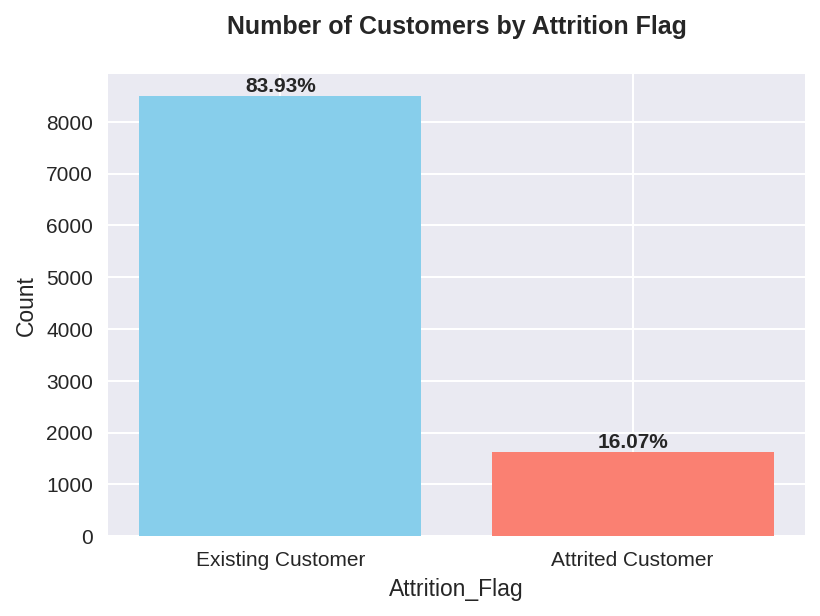

In [11]:
#Count the occurrences of each category in Attrition_Flag column
count_data = df_bank['Attrition_Flag'].value_counts()
total_count = count_data.sum()
percentage_data = count_data / total_count * 100

bar_colors = ['skyblue', 'salmon']
fig, ax = plt.subplots(figsize=(6, 4), dpi=150)
bars = ax.bar(count_data.index, count_data, color=bar_colors)
ax.set_xlabel('Attrition_Flag')
ax.set_ylabel('Count')
ax.set_title('Number of Customers by Attrition Flag\n', fontweight='bold')

#Show the count values as percentages
for i, v in enumerate(percentage_data):
    ax.text(i, count_data[i], f'{v:.2f}%', ha='center', va='bottom', fontweight='bold')

plt.show()

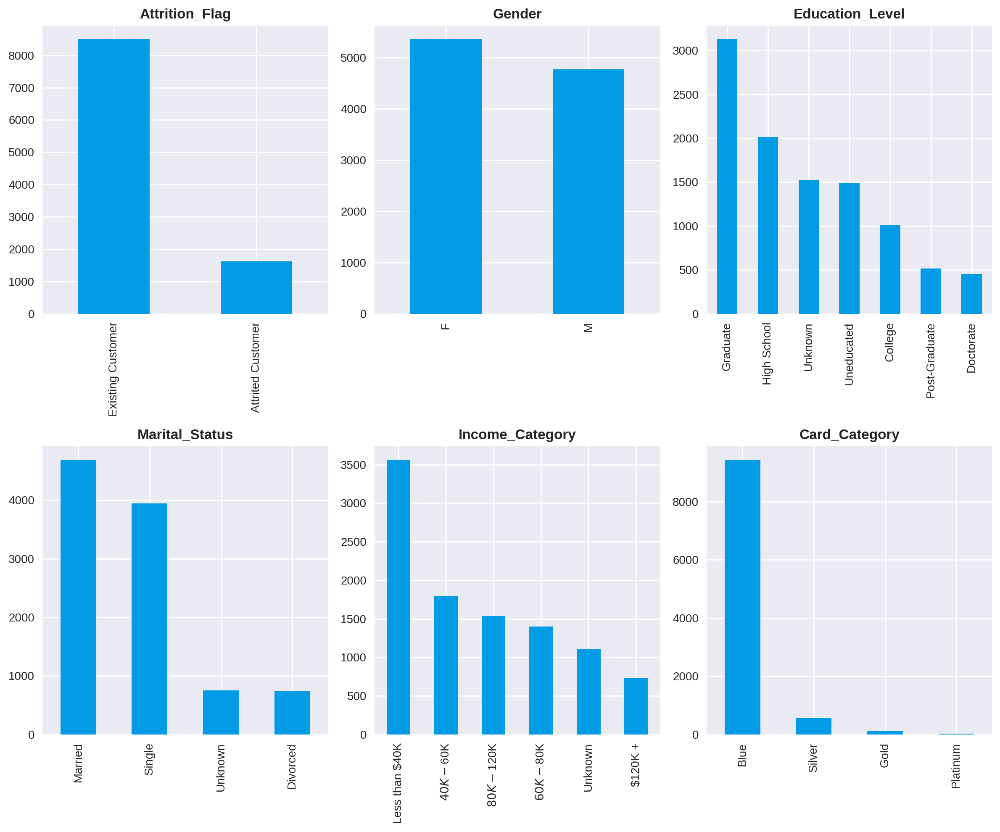

In [34]:
#Categorical data

columns = ['Attrition_Flag', 'Gender', 'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category']

# Calculate the number of rows and columns for the subplots
num_cols = 3
num_rows = math.ceil(len(columns) / num_cols)

# Create a figure with subplots in a matrix layout
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(12, 10), dpi=200)
fig.subplots_adjust(hspace=0.7, wspace=0.5)

# Flatten the axes array for easier indexing
axes = axes.flatten()
hist_color = '#039BE5'

# Iterate over the columns and plot histograms
for i, col in enumerate(columns):
    # Plot histogram for the current column
    df_bank[col].value_counts().plot(kind='bar', ax=axes[i], color=hist_color)
    axes[i].set_xlabel(None)
    axes[i].set_ylabel(None)
    axes[i].set_title(col, fontweight='bold')

# Hide any unused subplots
if len(columns) < len(axes):
    for j in range(len(columns), len(axes)):
        axes[j].axis('off')


fig.tight_layout()
plt.show()


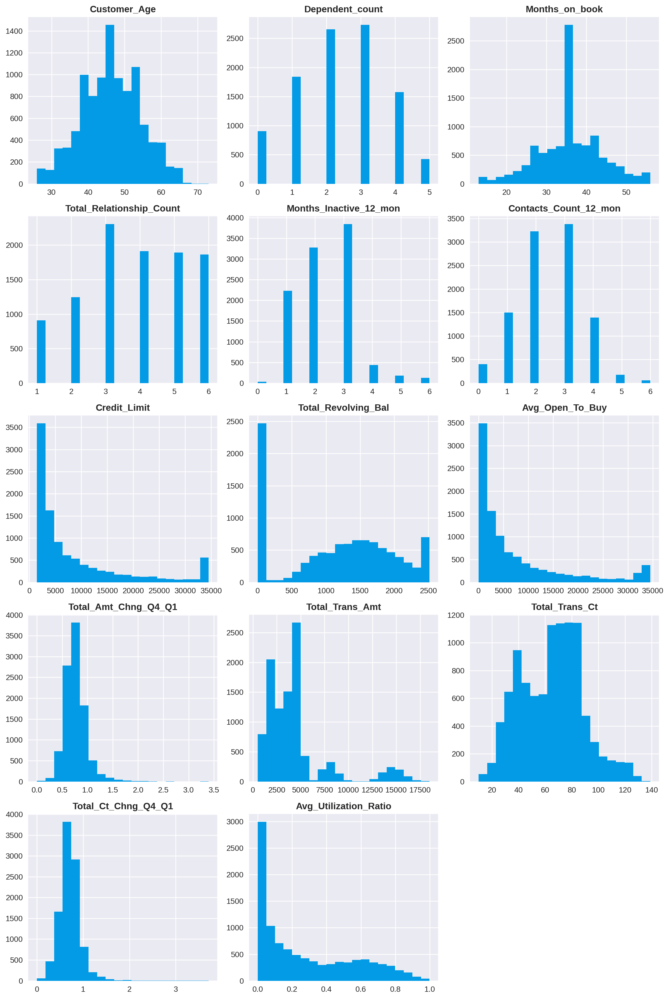

In [25]:
#Numerical data

numerical_columns = ['Customer_Age', 'Dependent_count','Months_on_book', 'Total_Relationship_Count',
                     'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
                     'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Trans_Ct',
                     'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']

# Calculate the number of rows and columns for the subplots
num_cols = 3
num_rows = math.ceil(len(numerical_columns) / num_cols)

# Create a figure with subplots in a matrix layout
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(12, 18), dpi=200)
axes = axes.flatten()
hist_color = '#039BE5'

# Iterate over the numerical columns and plot histograms
for i, col in enumerate(numerical_columns):
    # Plot histogram for the current column
    df_bank[col].plot.hist(ax=axes[i], bins=20, color=hist_color)
    axes[i].set_xlabel(None)
    axes[i].set_ylabel(None)
    axes[i].set_title(col, fontweight='bold')

# Hide any unused subplots
if len(numerical_columns) < len(axes):
    for j in range(len(numerical_columns), len(axes)):
        axes[j].axis('off')

fig.tight_layout()
plt.show()


In [35]:
#Drop column that will be not used
df_bank = df_bank.drop(columns = ['Naive_Bayes1','Naive_Bayes2'])

check = df_bank.columns
print(check)

Index(['CLIENTNUM', 'Attrition_Flag', 'Customer_Age', 'Gender',
       'Dependent_count', 'Education_Level', 'Marital_Status',
       'Income_Category', 'Card_Category', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'],
      dtype='object')


In [36]:
#Consider correlations values
# Define the encoding for Attrition_Flag
encoding = {'Attrited Customer': 1, 'Existing Customer': 0}

# Map the encoding to the Attrition_Flag column
df_bank['Attrition_Encoded'] = df_bank['Attrition_Flag'].map(encoding)

# Select the columns for correlation calculation
columns_for_correlation = ['Customer_Age', 'Dependent_count', 'Months_on_book', 'Total_Relationship_Count',
                           'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
                           'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Trans_Ct',
                           'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']

# Calculate correlation between selected columns and Attrition_Encoded
correlations = df_bank[columns_for_correlation].corrwith(df_bank['Attrition_Encoded'])
correlations_df = pd.DataFrame({'Attribute': correlations.index, 'Value': correlations.values})

correlations_df = correlations_df.sort_values(by='Value', ascending=False)
display(correlations_df)

,Attribute,Value
5,Contacts_Count_12_mon,0.204491
4,Months_Inactive_12_mon,0.152449
1,Dependent_count,0.018991
0,Customer_Age,0.018203
2,Months_on_book,0.013687
8,Avg_Open_To_Buy,-0.000285
6,Credit_Limit,-0.023873
9,Total_Amt_Chng_Q4_Q1,-0.131063
3,Total_Relationship_Count,-0.150005
10,Total_Trans_Amt,-0.168598


# RFM Model


---
RFM Model: ใช้สำหรับพิจารณาแบ่งกลุ่ม Customer Segment


In [37]:
#Select the desired columns from df_bank
selected_columns = ['CLIENTNUM', 'Months_on_book', 'Total_Trans_Ct', 'Total_Trans_Amt']
selected_data = df_bank[selected_columns]

display(selected_data.head(5))

,CLIENTNUM,Months_on_book,Total_Trans_Ct,Total_Trans_Amt
0,768805383,39,42,1144
1,818770008,44,33,1291
2,713982108,36,20,1887
3,769911858,34,20,1171
4,709106358,21,28,816


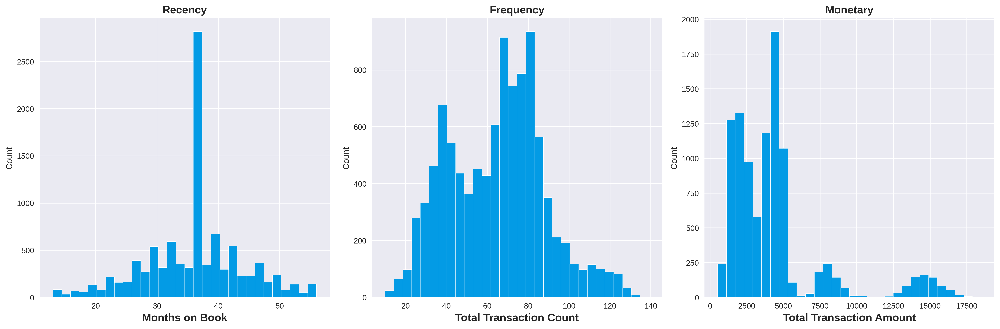

In [39]:
#Statistical distributions of the recency, frequency, and monetary data
fig, axs = plt.subplots(1, 3, figsize=(18, 6), dpi=300)

#Create histograms for each column
axs[0].hist(df_bank['Months_on_book'], bins=30, edgecolor='white', color='#039BE5')
axs[1].hist(df_bank['Total_Trans_Ct'], bins=30, edgecolor='white', color='#039BE5')
axs[2].hist(df_bank['Total_Trans_Amt'], bins=30, edgecolor='white', color='#039BE5')

#Set labels and titles for each subplot
axs[0].set_xlabel('Months on Book', fontweight='bold', fontsize=14)
axs[0].set_ylabel('Count')
axs[0].set_title('Recency', fontweight='bold', fontsize=14)

axs[1].set_xlabel('Total Transaction Count', fontweight='bold', fontsize=14)
axs[1].set_ylabel('Count')
axs[1].set_title('Frequency', fontweight='bold', fontsize=14)
axs[2].set_xlabel('Total Transaction Amount', fontweight='bold', fontsize=14)
axs[2].set_ylabel('Count')
axs[2].set_title('Monetary', fontweight='bold', fontsize=14)

#Adjust spacing between subplots
plt.tight_layout()

#Display the plot
plt.show()

# Calculating RFM Scores


---
กำหนดเกณฑ์คะแนนตั้งแต่ 1 ถึง 5 และแบ่งจำนวนลูกค้าออกเป็นทั้งหมด 5 ช่วง เพื่อให้คะแนนในแต่ละด้านของ RFM Model


In [40]:
#Set RFM by binning the raw RFM metrics into quintiles
df_bank['percentile_R'] = df_bank['Months_on_book'].rank(pct=True)
df_bank['rank_R'] = pd.cut(df_bank['percentile_R'], bins=5, labels=[1, 2, 3, 4, 5])

df_bank['percentile_F'] = df_bank['Total_Trans_Ct'].rank(pct=True)
df_bank['rank_F'] = pd.cut(df_bank['percentile_F'], bins=5, labels=[1, 2, 3, 4, 5])

df_bank['percentile_M'] = df_bank['Total_Trans_Amt'].rank(pct=True)
df_bank['rank_M'] = pd.cut(df_bank['percentile_M'], bins=5, labels=[1, 2, 3, 4, 5])

df_bank['type'] = df_bank.apply(lambda x : str(x['rank_R']) + str(x['rank_F']) + str(x['rank_M']) ,axis = 1)



df_bank.head(5)

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Attrition_Encoded,percentile_R,rank_R,percentile_F,rank_F,percentile_M,rank_M,type
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1.625,0.061,0,0.705145,4,0.211563,2,0.027698,1,421
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,3.714,0.105,0,0.849264,5,0.094845,1,0.051595,1,511
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,2.333,0.000,0,0.497087,3,0.010862,1,0.193098,1,311
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,2.333,0.760,0,0.326750,2,0.010862,1,0.030907,1,211
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,2.500,0.000,0,0.041967,1,0.049669,1,0.007307,1,111


In [41]:
df_seg = pd.read_csv("segment.csv", sep=',', encoding='latin-1')
df_seg.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 125 entries, 0 to 124
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   RFM            125 non-null    int64 
 1   Segment        125 non-null    object
 2   No             125 non-null    int64 
 3   Group Segment  125 non-null    object
dtypes: int64(2), object(2)
memory usage: 4.0+ KB


In [42]:
df_bank['type'] = df_bank['type'].astype(int)

result = pd.merge(df_bank, df_seg, left_on='type', right_on='RFM', how='inner')
result.head(5)

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,rank_R,percentile_F,rank_F,percentile_M,rank_M,type,RFM,Segment,No,Group Segment
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,4,0.211563,2,0.027698,1,421,421,About to sleep,7,7.About to sleep
1,785387883,Existing Customer,47,F,3,High School,Single,$40K - $60K,Blue,41,...,4,0.273181,2,0.124173,1,421,421,About to sleep,7,7.About to sleep
2,780466533,Existing Customer,54,M,3,Doctorate,Married,$120K +,Blue,41,...,4,0.321171,2,0.189790,1,421,421,About to sleep,7,7.About to sleep
3,799224108,Existing Customer,46,F,4,Graduate,Single,Less than $40K,Blue,40,...,4,0.225338,2,0.150834,1,421,421,About to sleep,7,7.About to sleep
4,709122483,Existing Customer,56,M,3,Graduate,Married,$60K - $80K,Blue,37,...,4,0.337119,2,0.198479,1,421,421,About to sleep,7,7.About to sleep


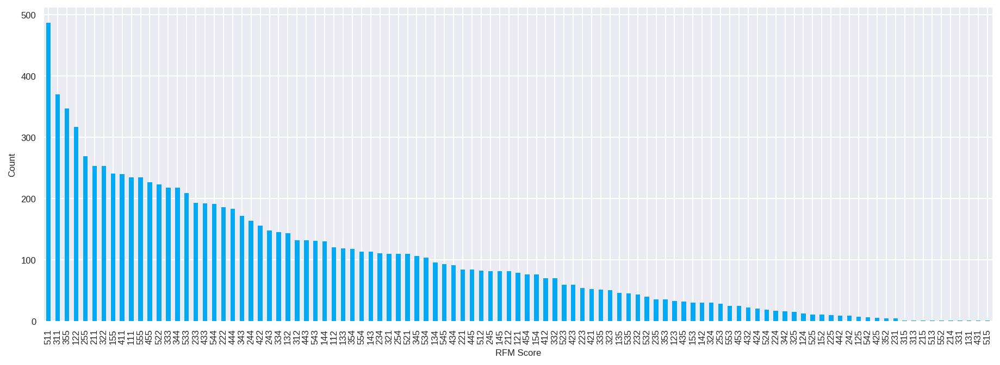

In [43]:
#RFM score from the largest to the lowest
fig = plt.figure(figsize=(15, 5),dpi=150)
fig.subplots_adjust(hspace=0.8, wspace=0.5)

ax = result['RFM'].value_counts().plot(kind='bar', fontsize=8,color='#03A9F4' )
ax.set_xlabel("RFM Score", fontsize=8)
ax.set_ylabel("Count", fontsize=8)
plt.show()

In [44]:
import pandas as pd

# Select the desired columns
selected_columns = ['CLIENTNUM', 'Months_on_book', 'Total_Trans_Ct', 'Total_Trans_Amt', 'rank_R', 'rank_F', 'rank_M']
selected_data = result[selected_columns]

# Display the selected columns as a table
display(pd.DataFrame(selected_data.head(5)))

,CLIENTNUM,Months_on_book,Total_Trans_Ct,Total_Trans_Amt,rank_R,rank_F,rank_M
0,768805383,39,42,1144,4,2,1
1,785387883,41,47,1594,4,2,1
2,780466533,41,52,1873,4,2,1
3,799224108,40,43,1715,4,2,1
4,709122483,37,54,1909,4,2,1


พิจารณาแบ่งกลุ่ม Customer Segment ออกเป็นทั้งหมด 11 กลุ่ม ดังตาราง
Source: https://www.putler.com/rfm-analysis/

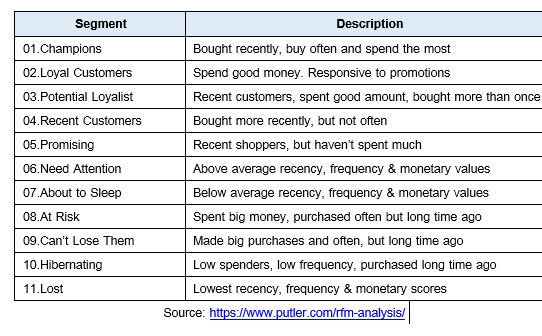

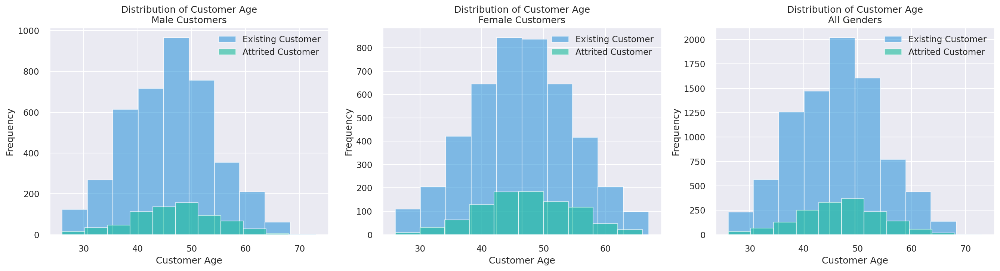

In [89]:
# Filter the data based on attrition
df_male_existing = df_bank[(df_bank['Attrition_Flag'] == 'Existing Customer') & (df_bank['Gender'] == 'M')]
df_male_attrited = df_bank[(df_bank['Attrition_Flag'] == 'Attrited Customer') & (df_bank['Gender'] == 'M')]
df_female_existing = df_bank[(df_bank['Attrition_Flag'] == 'Existing Customer') & (df_bank['Gender'] == 'F')]
df_female_attrited = df_bank[(df_bank['Attrition_Flag'] == 'Attrited Customer') & (df_bank['Gender'] == 'F')]
df_existing = df_bank[(df_bank['Attrition_Flag'] == 'Existing Customer') ]
df_attrited = df_bank[(df_bank['Attrition_Flag'] == 'Attrited Customer') ]

# Create subplots
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 5), dpi=150)

# Histogram 1: Male - Existing and Attrited Customers
ax1.hist(df_male_existing['Customer_Age'], bins=10, alpha=0.6, label='Existing Customer',color='#3498DB')
ax1.hist(df_male_attrited['Customer_Age'], bins=10, alpha=0.6, label='Attrited Customer',color='#1ABC9C')
ax1.set_xlabel('Customer Age')
ax1.set_ylabel('Frequency')
ax1.set_title('Distribution of Customer Age\nMale Customers')
ax1.legend()

# Histogram 2: Female - Existing and Attrited Customers
ax2.hist(df_female_existing['Customer_Age'], bins=10, alpha=0.6, label='Existing Customer',color='#3498DB')
ax2.hist(df_female_attrited['Customer_Age'], bins=10, alpha=0.6, label='Attrited Customer',color='#1ABC9C')
ax2.set_xlabel('Customer Age')
ax2.set_ylabel('Frequency')
ax2.set_title('Distribution of Customer Age\nFemale Customers')
ax2.legend()

# Histogram 3: All Genders - Existing and Attrited Customers
ax3.hist(df_existing['Customer_Age'], bins=10, alpha=0.6, label='Existing Customer',color='#3498DB')
ax3.hist(df_attrited['Customer_Age'], bins=10, alpha=0.6, label='Attrited Customer',color='#1ABC9C')
ax3.set_xlabel('Customer Age')
ax3.set_ylabel('Frequency')
ax3.set_title('Distribution of Customer Age\nAll Genders')
ax3.legend()

plt.tight_layout()

plt.show()


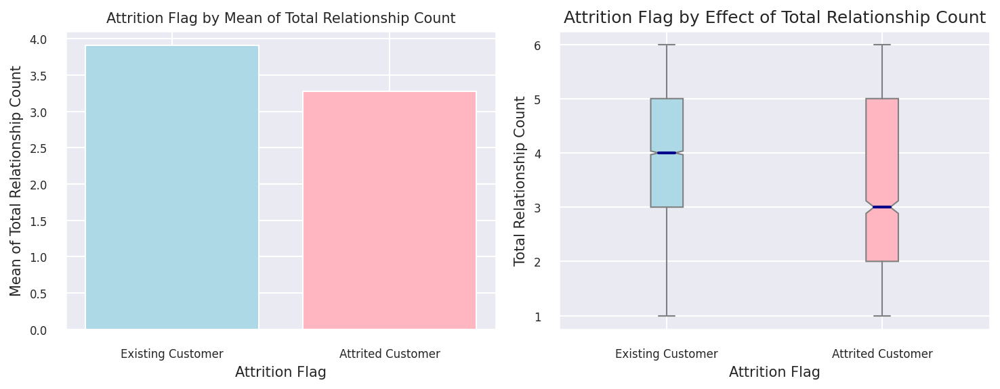

In [93]:
#Total_Relationship_Count by attrition flag
# Filter the data based on attrition flag
df_existing = df_bank[df_bank['Attrition_Flag'] == 'Existing Customer']
df_attrited = df_bank[df_bank['Attrition_Flag'] == 'Attrited Customer']

# Calculate the mean Total_Relationship_Count for each group
mean_existing = df_existing['Total_Relationship_Count'].mean()
mean_attrited = df_attrited['Total_Relationship_Count'].mean()

# Create subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4), dpi=150)

# Grouped bar plot
ax1.bar(['Existing Customer', 'Attrited Customer'], [mean_existing, mean_attrited], color=['lightblue', 'lightpink'])
ax1.set_xlabel('Attrition Flag', fontsize=10)
ax1.set_ylabel('Mean of Total Relationship Count', fontsize=10)
ax1.set_title('Attrition Flag by Mean of Total Relationship Count', fontsize=10)
ax1.tick_params(axis='x', labelrotation=0)
ax1.tick_params(axis='both', labelsize=8)

# Box plot
box_colors = ['lightblue', 'lightpink']
boxes = ax2.boxplot([df_existing['Total_Relationship_Count'], df_attrited['Total_Relationship_Count']],
                    labels=['Existing Customer', 'Attrited Customer'],
                    notch=True,
                    patch_artist=True,
                    boxprops={'facecolor': box_colors[0], 'edgecolor': 'gray'},
                    whiskerprops={'color': 'gray'},
                    capprops={'color': 'gray'},
                    medianprops={'color': 'darkblue', 'linewidth': 2},
                    flierprops={'marker': 'o', 'markerfacecolor': 'red', 'markersize': 4}
                    )
for patch, color in zip(boxes['boxes'], box_colors):
    patch.set_facecolor(color)
ax2.set_xlabel('Attrition Flag', fontsize=10)
ax2.set_ylabel('Total Relationship Count', fontsize=10)
ax2.set_title('Attrition Flag by Effect of Total Relationship Count', fontsize=12)
ax2.tick_params(axis='x', labelrotation=0)
ax2.tick_params(axis='both', labelsize=8)

plt.tight_layout()

plt.show()


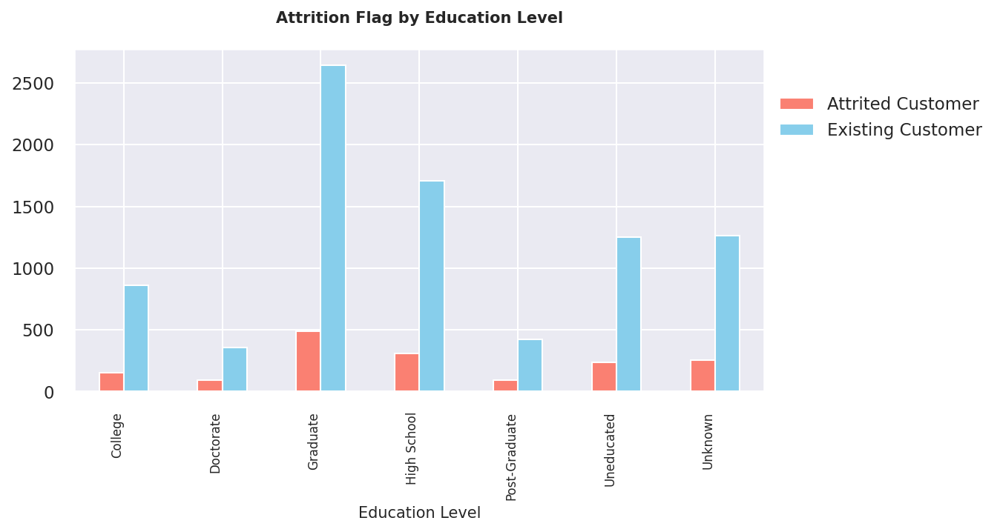

In [94]:
# Group the data by 'Education_Level' and 'Attrition_Flag' columns
grouped_data = df_bank.groupby(['Education_Level', 'Attrition_Flag']).size().unstack().fillna(0)

# Plot the bar chart with customized color
colors = ['salmon', 'skyblue']  # Red and blue colors
fig, ax = plt.subplots(figsize=(8, 4), dpi=150)
grouped_data.plot(kind='bar', color=colors, ax=ax)

ax.set_xlabel('Education Level',fontsize=10)
ax.set_ylabel(None)
ax.set_title('Attrition Flag by Education Level\n', fontdict={'fontsize': 10, 'fontweight': 'bold'})
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='right', fontsize=8)

plt.legend(loc='center left', bbox_to_anchor=(1, 0.8))

plt.show()

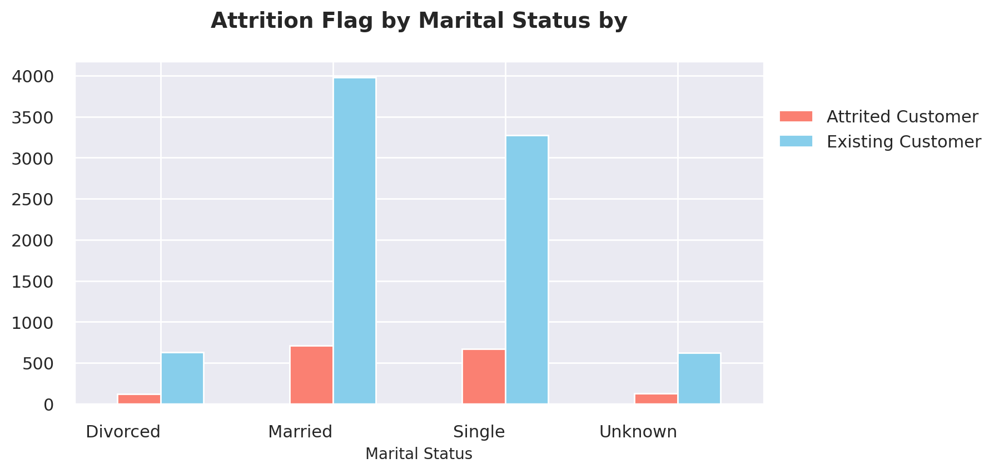

In [95]:
# Group the data by 'Marital_Status' and 'Attrition_Flag' columns
grouped_data = df_bank.groupby(['Marital_Status', 'Attrition_Flag']).size().unstack().fillna(0)

colors = ['salmon', 'skyblue']  # Red and blue colors
fig, ax = plt.subplots(figsize=(8, 4), dpi=200)
grouped_data.plot(kind='bar', color=colors, ax=ax)

# Set labels and title
ax.set_xlabel('Marital Status',fontsize=10)
ax.set_ylabel(None)
ax.set_title('Attrition Flag by Marital Status by\n', fontdict={'fontsize': 14, 'fontweight': 'bold'})
ax.set_xticklabels(ax.get_xticklabels(), rotation=0, ha='right')

plt.legend(loc='center left', bbox_to_anchor=(1, 0.8))

plt.show()


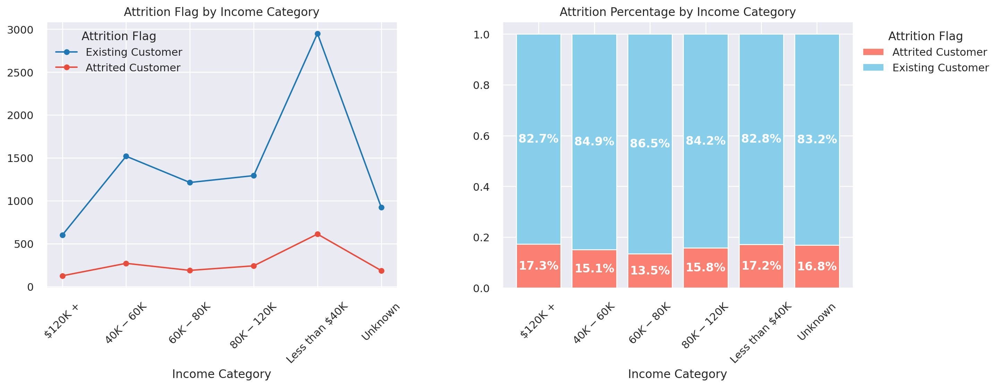

In [96]:
# Group the data by 'Attrition_Flag' and 'Income_Category' and calculate the count
grouped_data = df_bank.groupby(['Attrition_Flag', 'Income_Category']).size().unstack()

# Create a figure with subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5), dpi=200)

# Line plot for Existing Customer
ax1.plot(grouped_data.loc['Existing Customer'], marker='o', color='#1f77b4', label='Existing Customer')

# Line plot for Attrited Customer
ax1.plot(grouped_data.loc['Attrited Customer'], marker='o', color='#E74C3C', label='Attrited Customer')

ax1.set_xlabel('Income Category')
ax1.set_ylabel(None)
ax1.set_title('Attrition Flag by Income Category')
ax1.legend(title='Attrition Flag')
ax1.tick_params(axis='x', rotation=45)

# Group the data by 'Income_Category' and 'Attrition_Flag' and calculate the count
grouped_data = df_bank.groupby(['Income_Category', 'Attrition_Flag']).size().unstack()

# Calculate the ratio of Attrition_Flag for each Income_Category
ratio_data = grouped_data.div(grouped_data.sum(axis=1), axis=0)

# Create a stacked bar plot

colors = ['salmon', 'skyblue']
bars = ratio_data.plot(kind='bar', stacked=True, color=colors, width=0.8, ax=ax2)  # Decrease bar width

# Add percentage labels to the bars
for container in bars.containers:
    for rect in container:
        width = rect.get_width()
        height = rect.get_height()
        x = rect.get_x()
        y = rect.get_y()
        percentage = f'{height:.1%}'
        ax2.annotate(percentage, (x + width / 2, y + height / 2), ha='center', va='center', fontsize=12, fontweight='bold', color='white')

# Plot styling for Stacked bar plot
ax2.set_xlabel('Income Category')
ax2.set_ylabel(None)
ax2.set_title('Attrition Percentage by Income Category')
ax2.legend(title='Attrition Flag', bbox_to_anchor=(1, 1))  # Move legend to the right side
ax2.tick_params(axis='x', rotation=45)

# Adjust spacing between subplots
fig.subplots_adjust(wspace=0.3)  # Add horizontal spacing between subplots

plt.show()


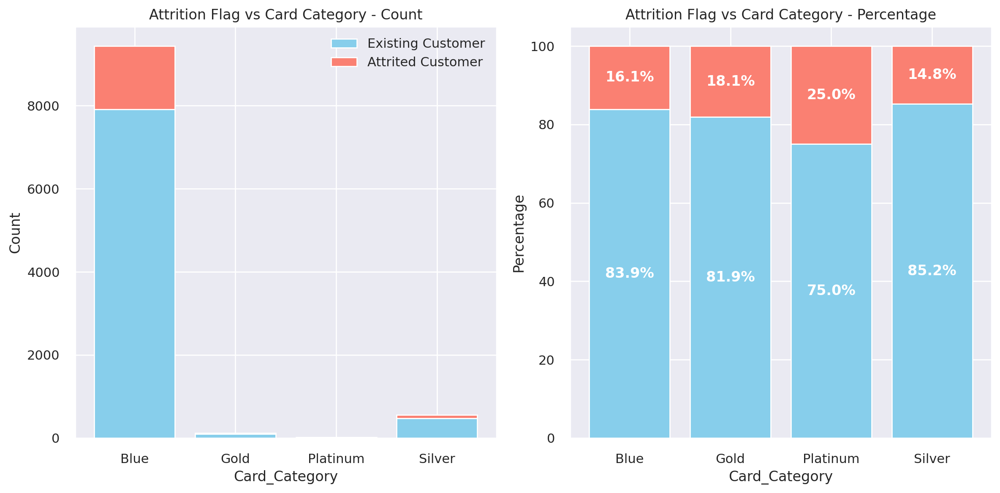

In [97]:
# Consider card category
grouped_counts = df_bank.groupby(['Card_Category', 'Attrition_Flag']).size().unstack()
grouped_percentages = grouped_counts.div(grouped_counts.sum(axis=1), axis=0) * 100

# Creating subplots
fig, axs = plt.subplots(1, 2, figsize=(12, 6), dpi=200)

# Plotting count bar chart
axs[0].bar(grouped_counts.index, grouped_counts['Existing Customer'], label='Existing Customer', color='skyblue')
axs[0].bar(grouped_counts.index, grouped_counts['Attrited Customer'], label='Attrited Customer', bottom=grouped_counts['Existing Customer'], color='salmon')
axs[0].set_xlabel('Card_Category')
axs[0].set_ylabel('Count')
axs[0].set_title('Attrition Flag vs Card Category - Count')
axs[0].legend()

# Plotting percentage bar chart
axs[1].bar(grouped_percentages.index, grouped_percentages['Existing Customer'], label='Existing Customer', color='skyblue')
axs[1].bar(grouped_percentages.index, grouped_percentages['Attrited Customer'], label='Attrited Customer', bottom=grouped_percentages['Existing Customer'], color='salmon')
axs[1].set_xlabel('Card_Category')
axs[1].set_ylabel('Percentage')
axs[1].set_title('Attrition Flag vs Card Category - Percentage')

# Adding percentages on top of each bar with bigger font size
for p in axs[1].patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    axs[1].annotate(f'{height:.1f}%', (x + width / 2, y + height / 2), ha='center', va='center', fontsize=12, fontweight='bold', color='white')


plt.tight_layout()
plt.show()


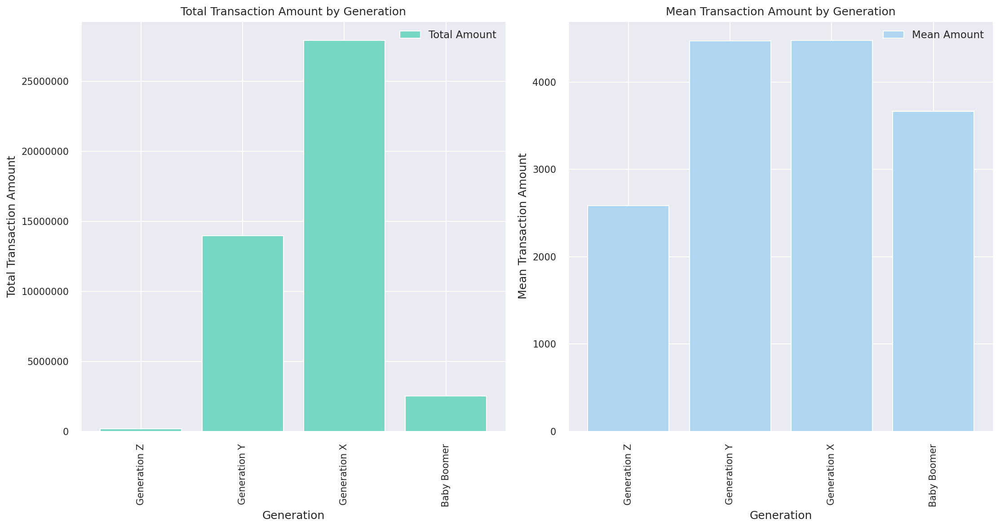

Generation
Generation Z    2586.641026
Generation Y    4469.251921
Generation X    4475.892239
Baby Boomer     3664.465893
Name: Total_Trans_Amt, dtype: float64


In [98]:
#Consider Generation
generation_ranges = {
    'Generation Z': (11, 26),
    'Generation Y': (27, 42),
    'Generation X': (43, 58),
    'Baby Boomer': (59, 120)  # Use a large upper bound for the last generation
}

# Create a new column 'Generation' based on the age ranges
df_bank['Generation'] = pd.cut(df_bank['Customer_Age'], bins=[0] + [r[1] for r in generation_ranges.values()], labels=list(generation_ranges.keys()))

generation_counts = df_bank['Generation'].value_counts().sort_index()

generation_totals = df_bank.groupby('Generation')['Total_Trans_Amt'].sum()
generation_means = df_bank.groupby('Generation')['Total_Trans_Amt'].mean()

# Create a figure with a grid of subplots
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 8), dpi=150)

# Plot the total transaction amount as a bar plot
axs[0].bar(generation_totals.index, generation_totals.values, color='#76D7C4', label='Total Amount')
axs[0].set_ylabel('Total Transaction Amount')

# Plot the mean transaction amount as a bar plot
axs[1].bar(generation_means.index, generation_means.values, color='#AED6F1', label='Mean Amount')
axs[1].set_ylabel('Mean Transaction Amount')

# Set the x-axis labels and title for both subplots
axs[0].set_xlabel('Generation')
axs[0].set_title('Total Transaction Amount by Generation')

axs[1].set_xlabel('Generation')
axs[1].set_title('Mean Transaction Amount by Generation')

# Rotate the x-axis labels for better readability
axs[0].tick_params(axis='x', rotation=90)
axs[1].tick_params(axis='x', rotation=90)

# Set the tick label font size for both subplots
axs[0].tick_params(axis='both', which='major', labelsize=10)
axs[1].tick_params(axis='both', which='major', labelsize=10)

axs[0].get_yaxis().get_major_formatter().set_scientific(False)
axs[1].get_yaxis().get_major_formatter().set_scientific(False)

axs[0].legend()
axs[1].legend()

plt.tight_layout()
plt.show()

print(generation_means)

# Customer Segment


---



In [99]:
df_grouped = result.groupby(by=['No','Segment'])['CLIENTNUM'].count().reset_index()
df_grouped.sort_values(by='No', ascending=True)
df_grouped.rename(columns={'CLIENTNUM':'Count_Customer'}, inplace=True)
display(df_grouped)

,No,Segment,Count_Customer
0,1,Champions,988
1,2,Loyal Customers,1152
2,3,Potential loyalist,988
3,4,Recent customers,1329
4,5,Promising,479
5,6,Need Attention,763
6,7,About to sleep,295
7,8,At risk,1528
8,9,Can not lose them,541
9,10,Hibernating,1385


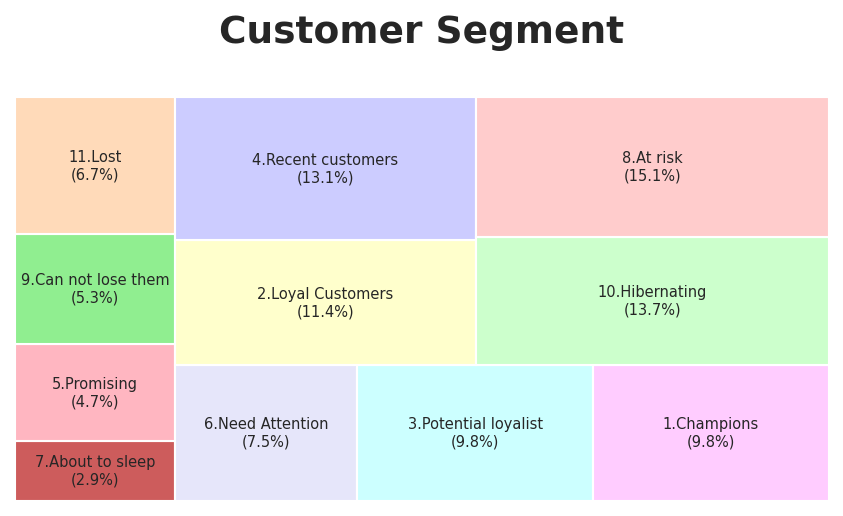

In [100]:
#Customer Segment
grouped = result.groupby('Group Segment')
count_values = grouped['CLIENTNUM'].count().to_frame()
# Set the font family
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Tahoma', 'DejaVu Sans', 'Lucida Grande', 'Verdana']
plt.figure(figsize=(7,3.5), dpi=150)

# Sort the values in descending order
sorted_values = count_values['CLIENTNUM'].sort_values(ascending=False)

# Define the sizes for the treemap in reverse order
sizes = sorted_values.values[::-1]

# Calculate the percentages
total = sum(sizes)
percentages = [(size / total) * 100 for size in sizes]

# Define the labels for each rectangle in reverse order
labels = [f"{label}\n({percent:.1f}%)" for label, percent in zip(sorted_values.index[::-1], percentages)]

# Define the colors for each rectangle in reverse order
colors = [
    "#FFCCCC",  # Light Red
    "#CCFFCC",  # Light Green
    "#CCCCFF",  # Light Blue
    "#FFFFCC",  # Light Yellow
    "#FFCCFF",  # Light Magenta
    "#CCFFFF",  # Light Cyan
    "#E6E6FA",  # Lavender
    "#FFDAB9",  # Peachpuff
    "#90EE90",  # Light Green
    "#FFB6C1",  # Light Pink
    "#CD5C5C"   # Indian Red
][::-1]

# Set the text properties for labels
text_props = {"fontsize": 7}

# Plot the treemap with adjusted text size and percentage labels
squarify.plot(sizes=sizes, label=labels, color=colors, text_kwargs=text_props)

# Add a title
plt.title("Customer Segment\n", fontsize=18, fontweight='bold')

# Remove axes
plt.axis('off')

# Show the plot
plt.show()


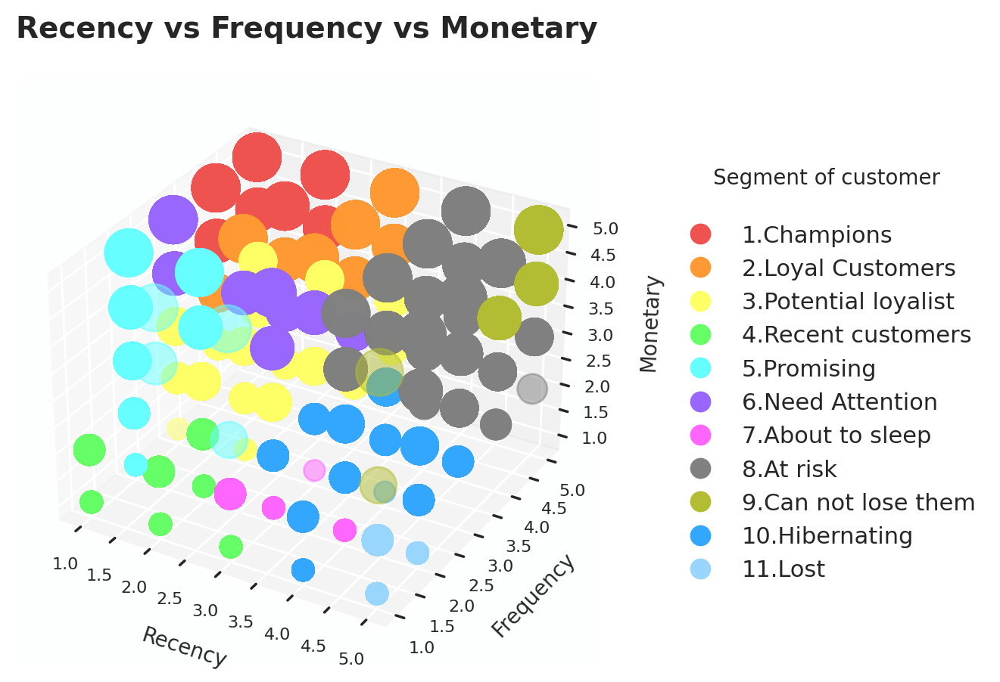

In [101]:
%matplotlib inline
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import pandas as pd
import numpy as np
import re

# Sample data
recency = pd.to_numeric(result['rank_R'])
frequency = pd.to_numeric(result['rank_F'])
monetary = pd.to_numeric(result['rank_M'])
segment = result['Group Segment']

# Sort the segment descriptions
segment_sorted = segment.unique()
segment_sorted.sort()

# Create a 3D plot
fig = plt.figure(figsize=(10,5),dpi=200)
ax = fig.add_subplot(111, projection='3d')
ax.set_facecolor('#FDFEFE')

# Define bubble sizes (adjust the scaling factor as needed)
bubble_sizes = monetary * 100

# Define custom colors for each segment (slightly darker shades)
segment_colors = ['#EF5350', '#FF9933', '#FFFF66', '#66FF66', '#66FFFF', '#9966FF', '#FF66FF', '#808080', '#B2BD33', '#33A6FF', '#99D6FF']


# Extract numerical prefixes from segment names
segment_prefixes = [re.findall(r'^\d+', seg)[0] if re.match(r'^\d+', seg) else '' for seg in segment_sorted]
sorted_indices = sorted(range(len(segment_prefixes)), key=lambda x: int(segment_prefixes[x]) if segment_prefixes[x].isdigit() else float('inf'))

# Sort the segment descriptions based on the numerical prefixes
segment_sorted = [segment_sorted[i] for i in sorted_indices]

# Iterate over segments and plot each segment separately
for i, seg in enumerate(segment_sorted):
    seg_recency = recency[segment == seg]
    seg_frequency = frequency[segment == seg]
    seg_monetary = monetary[segment == seg]
    seg_bubble_sizes = bubble_sizes[segment == seg]
    seg_color = segment_colors[i % len(segment_colors)]

    # Plot Recency vs Frequency vs Monetary as a bubble plot
    ax.scatter(seg_recency, seg_frequency, seg_monetary,
               c=seg_color, s=seg_bubble_sizes, alpha=0.5, label=seg)

# Customizing the plot
ax.set_xlabel('Recency', fontsize=10)
ax.set_ylabel('Frequency', fontsize=10)
ax.set_zlabel('Monetary', fontsize=10)

ax.tick_params(axis='x', which='major', labelsize=8,pad=2)
ax.tick_params(axis='y', which='major', labelsize=8,pad=2)
ax.tick_params(axis='z', which='major', labelsize=8,pad=2)

# Add legend on the right-hand side
legend_elements = [plt.Line2D([0], [0], marker='o', color='w', label=seg, markerfacecolor=color, markersize=10)
                   for seg, color in zip(segment_sorted, segment_colors)]
ax.legend(handles=legend_elements, loc='center left', bbox_to_anchor=(1.1, 0.5), title='Segment of customer\n', title_fontsize=10)

# Set the title with bold font and larger size
ax.set_title('Recency vs Frequency vs Monetary\n', fontweight='bold', fontsize=14)

plt.show()


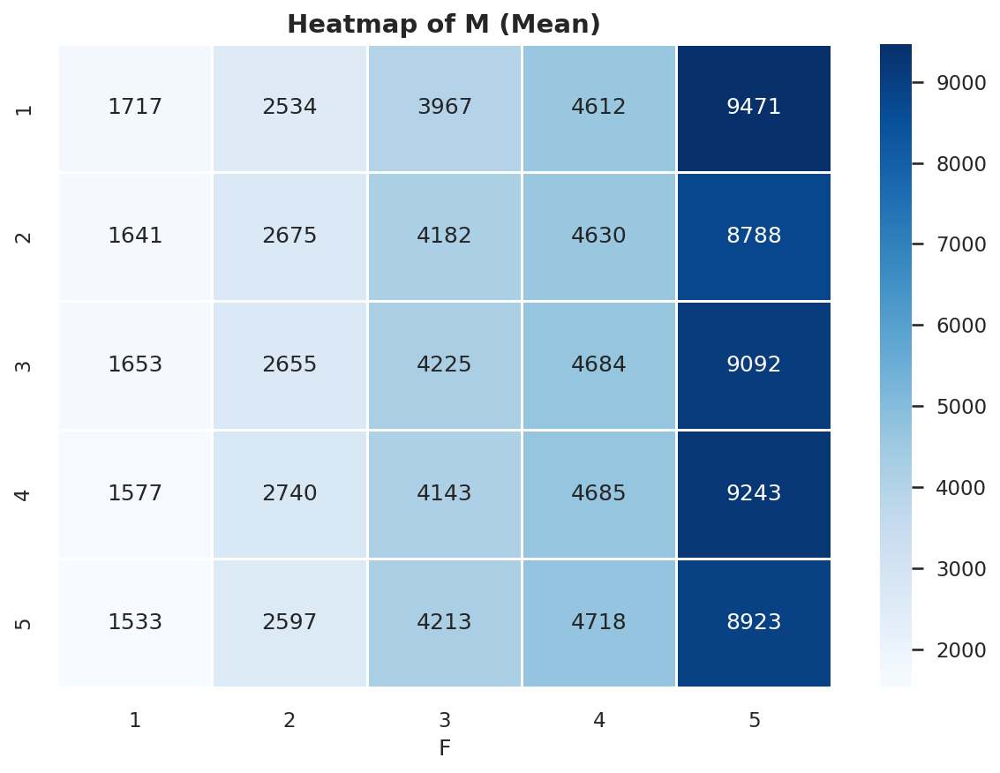

In [102]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Create a pivot table with 'rank_R' as index, 'rank_F' as columns, and 'Total_Trans_Amt' as values
heatmap_data = result.pivot_table(index='rank_R', columns='rank_F', values='Total_Trans_Amt', aggfunc='mean')

# Create a heatmap
fig, ax = plt.subplots(figsize=(8, 6), dpi=150)
sns.heatmap(heatmap_data, cmap='Blues', linewidths=0.5, annot=True, fmt=".0f", cbar=True, ax=ax)

# Set labels and title
ax.set_xlabel('F')
ax.set_ylabel('')
ax.set_title('Heatmap of M (Mean)', fontweight='bold', fontsize=14)

# Adjust spacing
plt.tight_layout()

# Display the plot
plt.show()

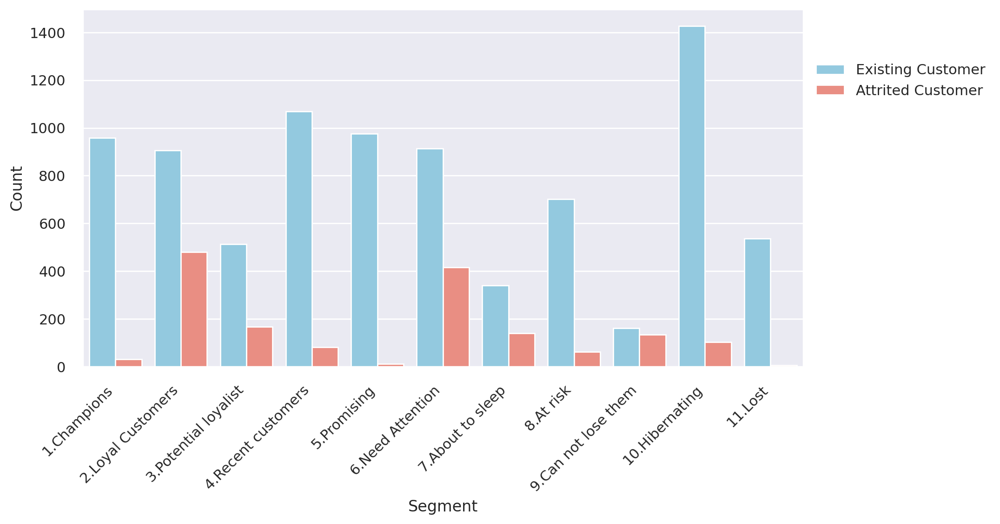

In [103]:
#Consider attrition by customer segment

desired_order = ['1.Champions', '2.Loyal Customers', '3.Potential loyalist', '4.Recent customers', '5.Promising', '6.Need Attention', '7.About to sleep',
                 '8.At risk', '9.Can not lose them', '10.Hibernating', '11.Lost']

# Sorting the DataFrame by 'Group Segment'
result_sorted = result.sort_values('Group Segment')

# Define custom color palette
custom_palette = ['skyblue', 'salmon']

# Set dpi
dpi = 200

# Set figure size
fig, ax = plt.subplots(figsize=(10, 5), dpi=dpi)

# Plotting the countplot
sns.countplot(data=result_sorted, x='Group Segment', hue='Attrition_Flag', palette=custom_palette)

# Rotating x-axis labels by 45 degrees
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

# Adding labels and title
ax.set_xticklabels(desired_order)
plt.xlabel('Segment')
plt.ylabel('Count')

# Moving the legend outside of the graph
plt.legend(loc='center left', bbox_to_anchor=(1, 0.8))

# Displaying the plot
plt.show()


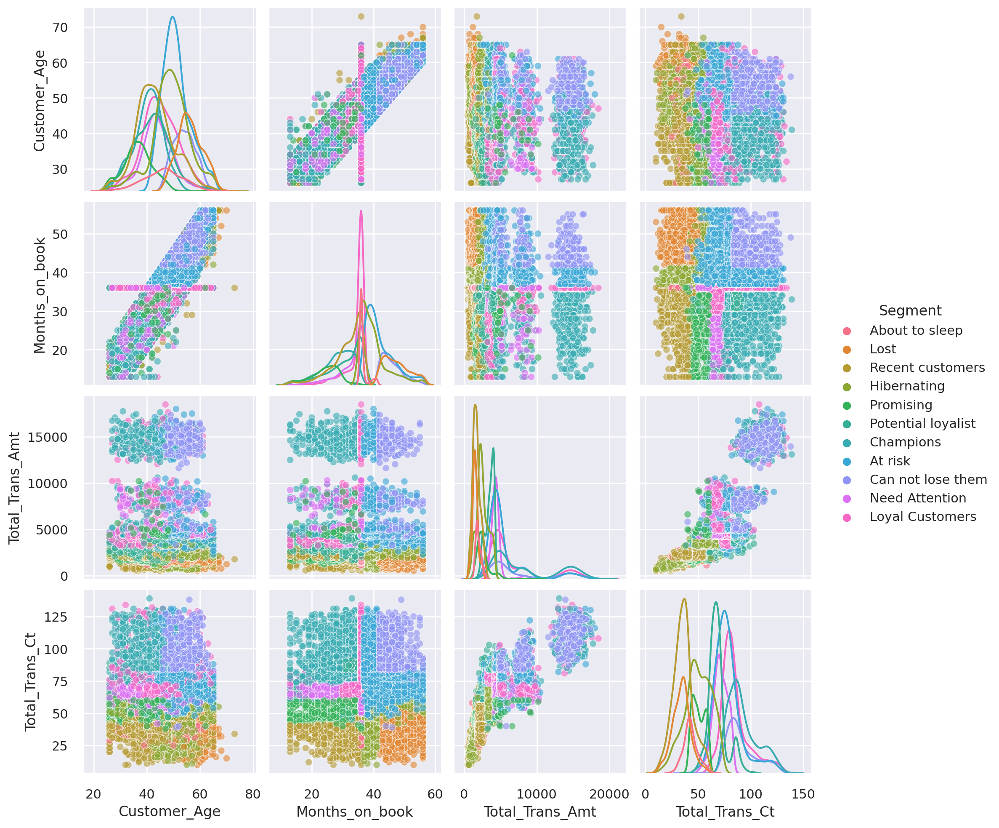

In [108]:
#Overview Demograph of all Gr.
#Let's see Gr. can't not lose them that the value of each attribute are quite high. Turn back strategy shall be focus on this Gr.

df_demo =result.loc[ : ,['Customer_Age', 'Months_on_book', 'Gender', 'Education_Level', 'Total_Trans_Amt', 'Total_Trans_Ct','Segment']]

sns.set(rc={'figure.dpi':200}) #focus on 8 9 10

# default: kind='scatter', diag_kind='auto'
sns.pairplot( data=df_demo,
              hue='Segment',
              plot_kws=dict(alpha=0.6),    # Set the non-diagonal plots
              diag_kws=dict(fill=False),   # Set the diagonal plots
           )


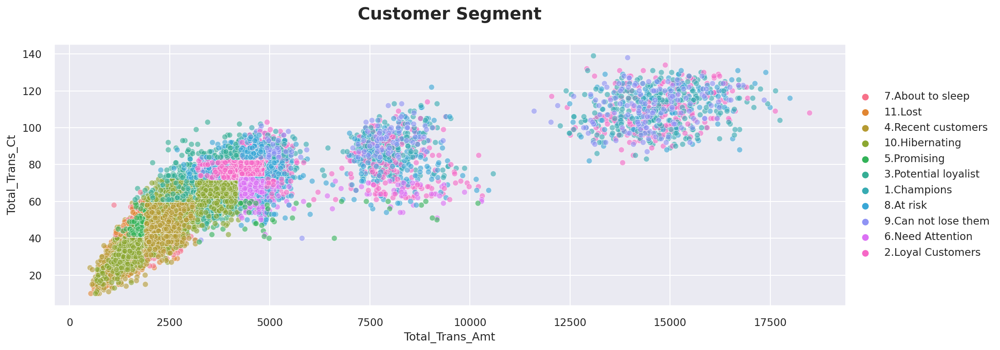

In [104]:
#Customer Segment : Frequency Vs Monetry

sns.set(rc={'figure.dpi': 150})
plt.figure(figsize=(15, 5), dpi=150)
ax = plt.gca()
sns.scatterplot(data=result, x="Total_Trans_Amt", y="Total_Trans_Ct", hue='Group Segment', alpha=0.6, ax=ax)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.title("Customer Segment\n", fontsize=18, fontweight='bold')

plt.show()

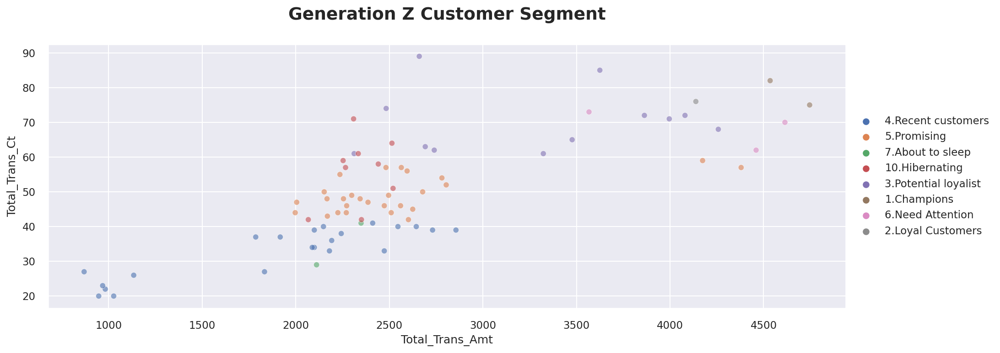

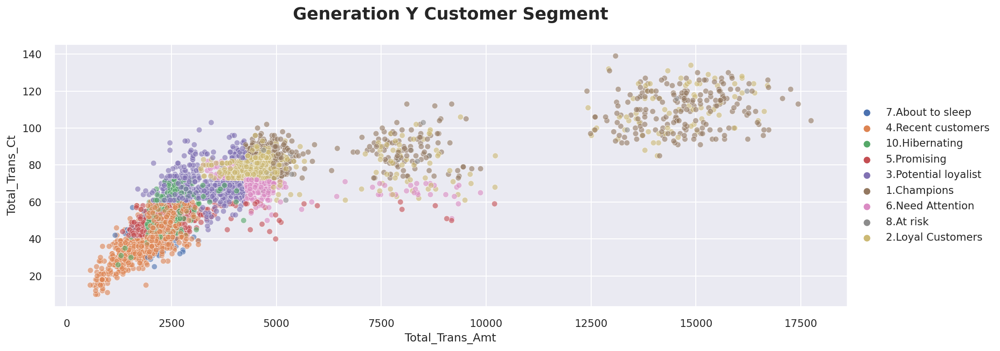

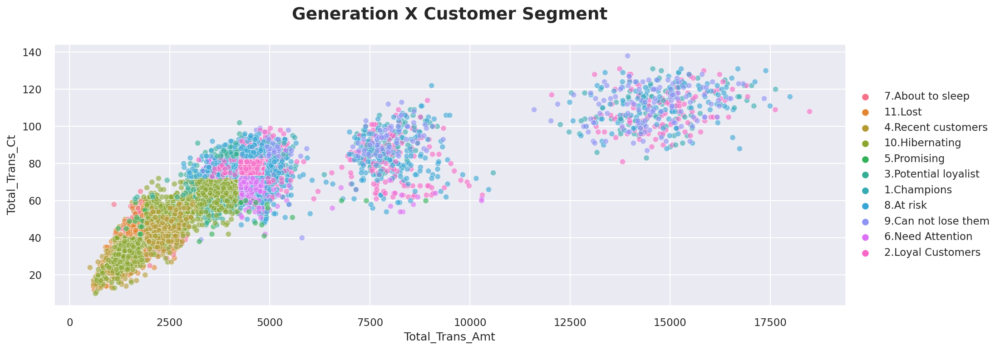

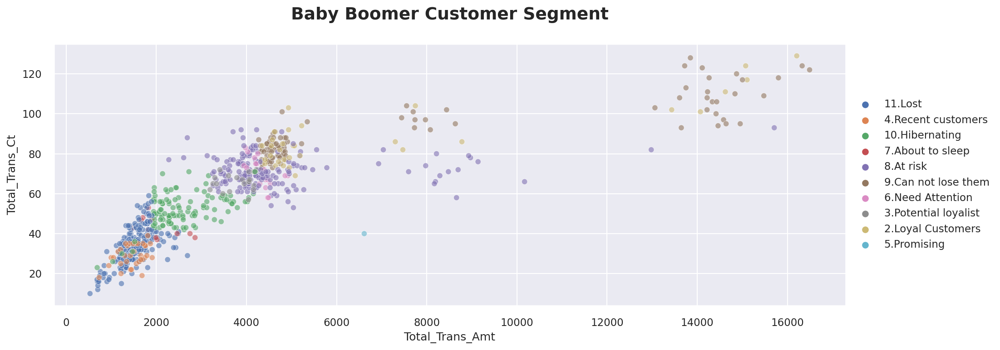

In [105]:
#Customer Segment : Frequency Vs Monetry (by Generation)

generation_ranges = {
    'Generation Z': (11, 26),
    'Generation Y': (27, 42),
    'Generation X': (43, 58),
    'Baby Boomer': (59, 120)  # Use a large upper bound for the last generation
}

# Create separate graphs for each generation
for generation, age_range in generation_ranges.items():
    # Filter data based on age range
    generation_data = result[(result['Customer_Age'] >= age_range[0]) & (result['Customer_Age'] <= age_range[1])]

    # Create the graph for the current generation
    sns.set(rc={'figure.dpi': 150})
    plt.figure(figsize=(15, 5), dpi=150)
    ax = plt.gca()
    sns.scatterplot(data=generation_data, x="Total_Trans_Amt", y="Total_Trans_Ct", hue='Group Segment', alpha=0.6, ax=ax)
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.title(f"{generation} Customer Segment\n", fontsize=18, fontweight='bold')
    plt.show()

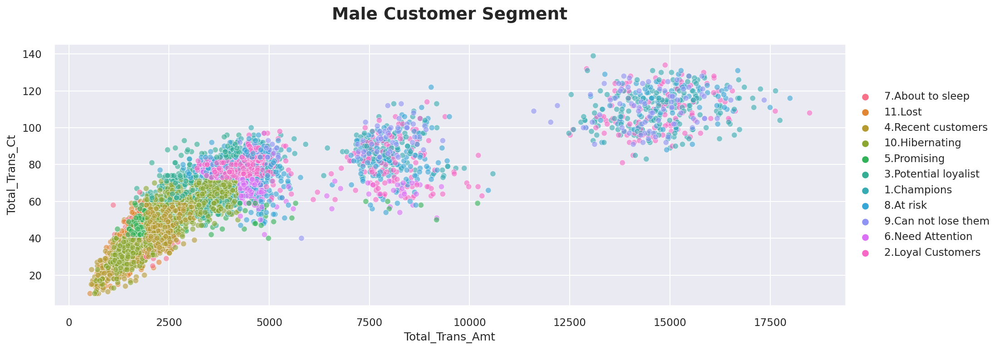

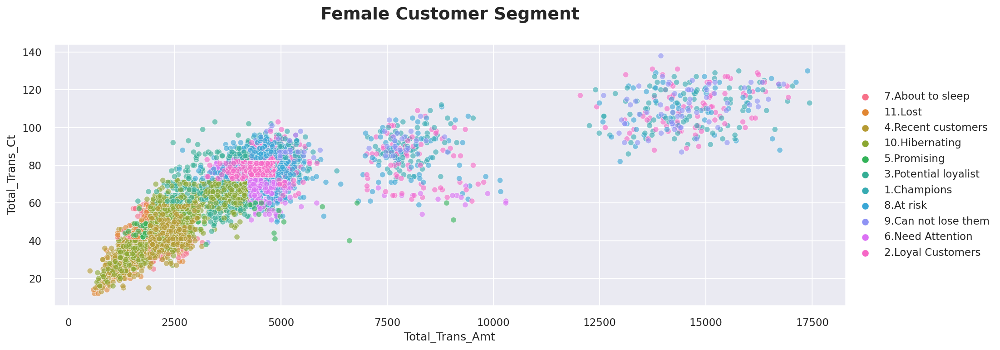

In [106]:
#Customer Segment : Frequency Vs Monetry (by Gender)

# Filter for male customers
male_data = result[result['Gender'] == 'M']

# Create the first graph for male customers
sns.set(rc={'figure.dpi': 150})
plt.figure(figsize=(15, 5), dpi=150)
ax = plt.gca()
sns.scatterplot(data=male_data, x="Total_Trans_Amt", y="Total_Trans_Ct", hue='Group Segment', alpha=0.6, ax=ax)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.title("Male Customer Segment\n", fontsize=18, fontweight='bold')
plt.show()

# Filter for female customers
female_data = result[result['Gender'] == 'F']

# Create the second graph for female customers
sns.set(rc={'figure.dpi': 150})
plt.figure(figsize=(15, 5), dpi=150)
ax = plt.gca()
sns.scatterplot(data=female_data, x="Total_Trans_Amt", y="Total_Trans_Ct", hue='Group Segment', alpha=0.6, ax=ax)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.title("Female Customer Segment\n", fontsize=18, fontweight='bold')
plt.show()


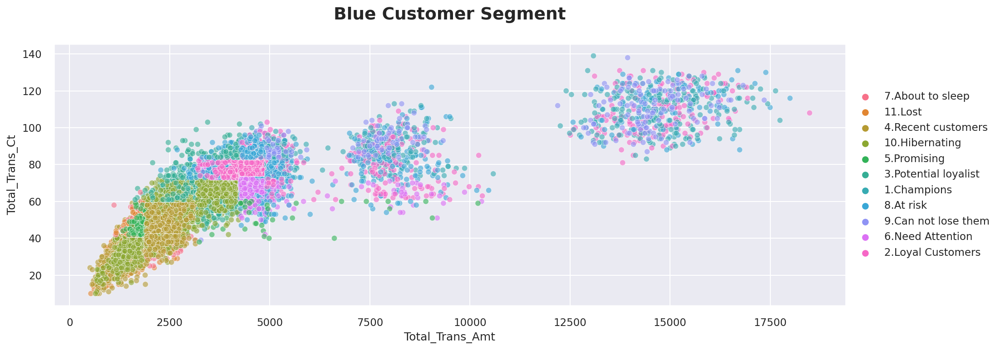

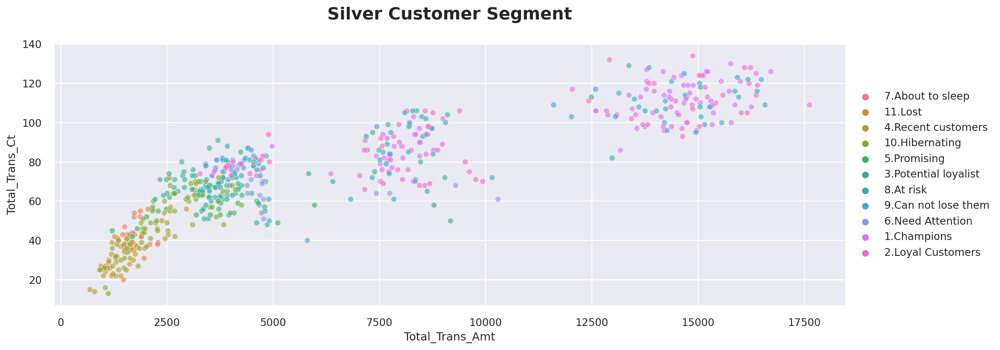

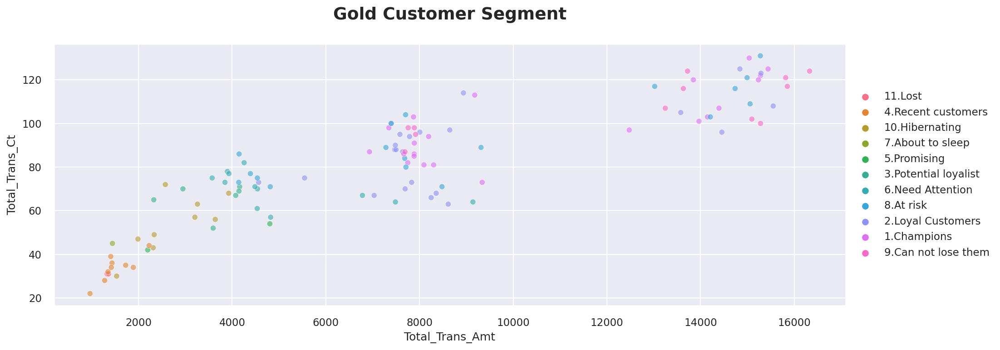

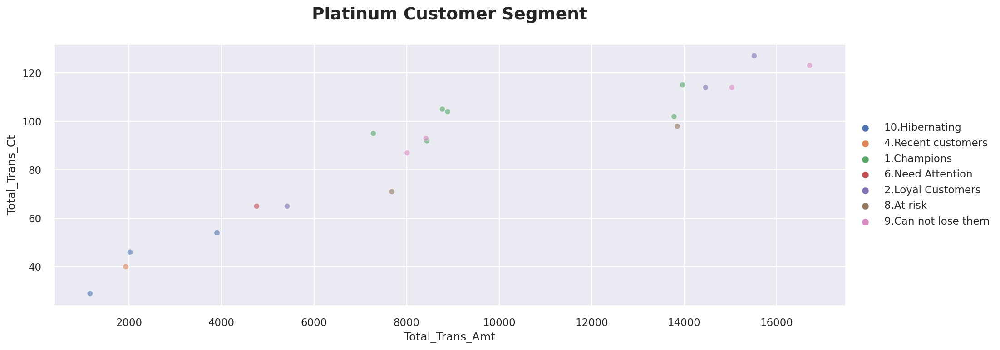

In [107]:
#Customer Segment : Frequency Vs Monetry (by Card )

income_categories = result['Card_Category'].unique()

# Create separate graphs for each income category
for category in income_categories:
    # Filter data based on income category
    category_data = result[result['Card_Category'] == category]

    # Create the graph for the current income category
    sns.set(rc={'figure.dpi': 150})
    plt.figure(figsize=(15, 5), dpi=150)
    ax = plt.gca()
    sns.scatterplot(data=category_data, x="Total_Trans_Amt", y="Total_Trans_Ct", hue='Group Segment', alpha=0.6, ax=ax)
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.title(f"{category} Customer Segment\n", fontsize=18, fontweight='bold')
    plt.show()

# Analyzing Customer Segment


---
พิจารณา Customer Segment โดยใช้ผลจาก RFM Model ร่วมกับข้อมูล Demographic เพื่อทำให้เข้าใจพฤติกรรมของลูกค้าได้ดียิ่งขึ้น โดยเฉพาะกลุ่ม “At risk”, “Can’t lose them” และ “Hibernating” ที่มีแนวโน้มจะเลิกใช้บริการ

In [109]:
#Consider 8, 9, 10 for Customer Churning

# Define the conditions for updating the 'Group_visualized' column
condition = result['Group Segment'].isin(['8.At risk', '9.Can not lose them', '10.Hibernating'])

# Update the 'Group_visualized' column using numpy.where()
result['Group_visualized'] = np.where(condition, 'Group 8,9,10', 'others')

# Print the updated DataFrame
result.head(5)


,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,percentile_F,rank_F,percentile_M,rank_M,type,RFM,Segment,No,Group Segment,Group_visualized
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,0.211563,2,0.027698,1,421,421,About to sleep,7,7.About to sleep,others
1,785387883,Existing Customer,47,F,3,High School,Single,$40K - $60K,Blue,41,...,0.273181,2,0.124173,1,421,421,About to sleep,7,7.About to sleep,others
2,780466533,Existing Customer,54,M,3,Doctorate,Married,$120K +,Blue,41,...,0.321171,2,0.189790,1,421,421,About to sleep,7,7.About to sleep,others
3,799224108,Existing Customer,46,F,4,Graduate,Single,Less than $40K,Blue,40,...,0.225338,2,0.150834,1,421,421,About to sleep,7,7.About to sleep,others
4,709122483,Existing Customer,56,M,3,Graduate,Married,$60K - $80K,Blue,37,...,0.337119,2,0.198479,1,421,421,About to sleep,7,7.About to sleep,others


In [110]:
#Focus on Existing Customer who in Group Segment 8, 9, 10

# Filter the DataFrame based on the condition
filtered_result = result[result['Attrition_Flag'] == 'Existing Customer']

# Define the conditions for updating the 'Group_visualized' column
condition = filtered_result['Group Segment'].isin(['8.At risk', '9.Can not lose them', '10.Hibernating'])

# Update the 'Group_visualized' column using numpy.where()
filtered_result['Group_visualized'] = np.where(condition, 'Group 8,9,10', 'others')

filtered_result.count()


<ipython-input-110-1226203d7bdc>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_result['Group_visualized'] = np.where(condition, 'Group 8,9,10', 'others')


CLIENTNUM                   8500
Attrition_Flag              8500
Customer_Age                8500
Gender                      8500
Dependent_count             8500
Education_Level             8500
Marital_Status              8500
Income_Category             8500
Card_Category               8500
Months_on_book              8500
Total_Relationship_Count    8500
Months_Inactive_12_mon      8500
Contacts_Count_12_mon       8500
Credit_Limit                8500
Total_Revolving_Bal         8500
Avg_Open_To_Buy             8500
Total_Amt_Chng_Q4_Q1        8500
Total_Trans_Amt             8500
Total_Trans_Ct              8500
Total_Ct_Chng_Q4_Q1         8500
Avg_Utilization_Ratio       8500
Attrition_Encoded           8500
percentile_R                8500
rank_R                      8500
percentile_F                8500
rank_F                      8500
percentile_M                8500
rank_M                      8500
type                        8500
RFM                         8500
Segment   

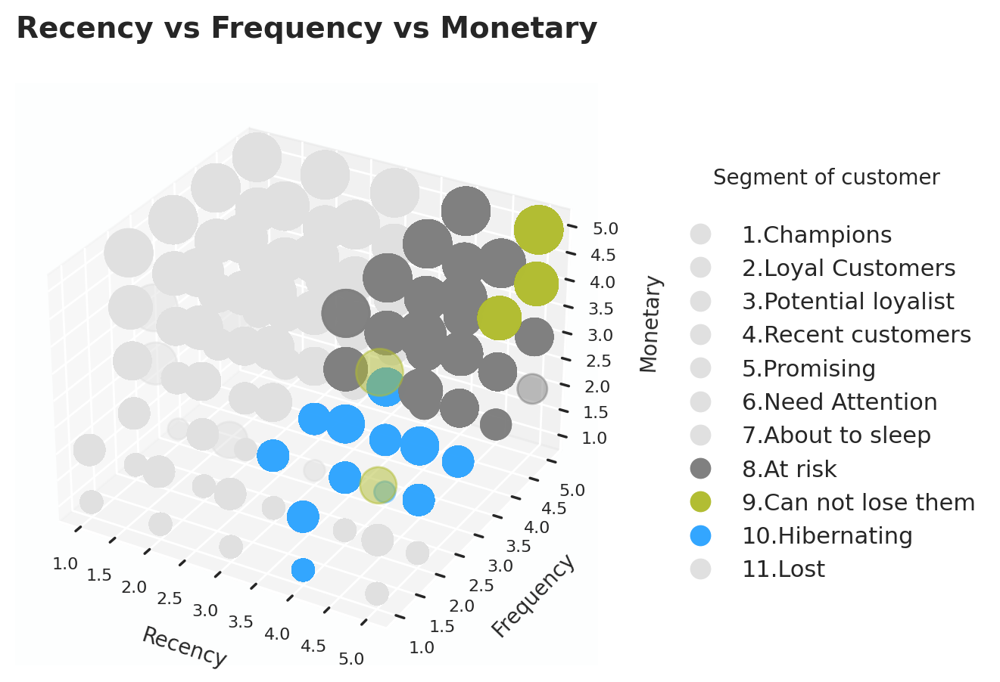

In [111]:
# Consider ONLY Gr. 8,9,10

recency = pd.to_numeric(result['rank_R'])
frequency = pd.to_numeric(result['rank_F'])
monetary = pd.to_numeric(result['rank_M'])
segment = result['Group Segment']

# Sort the segment descriptions
segment_sorted = segment.unique()
segment_sorted.sort()

# Create a 3D plot
fig = plt.figure(figsize=(10,5),dpi=200)
ax = fig.add_subplot(111, projection='3d')
ax.set_facecolor('#FDFEFE')

# Define bubble sizes (adjust the scaling factor as needed)
bubble_sizes = monetary * 100

# Define custom colors for each segment (slightly darker shades)
segment_colors = ['#E0E0E0', '#E0E0E0', '#E0E0E0', '#E0E0E0', '#E0E0E0', '#E0E0E0', '#E0E0E0', '#808080', '#B2BD33', '#33A6FF', '#E0E0E0']


# Extract numerical prefixes from segment names
segment_prefixes = [re.findall(r'^\d+', seg)[0] if re.match(r'^\d+', seg) else '' for seg in segment_sorted]
sorted_indices = sorted(range(len(segment_prefixes)), key=lambda x: int(segment_prefixes[x]) if segment_prefixes[x].isdigit() else float('inf'))

# Sort the segment descriptions based on the numerical prefixes
segment_sorted = [segment_sorted[i] for i in sorted_indices]

# Iterate over segments and plot each segment separately
for i, seg in enumerate(segment_sorted):
    seg_recency = recency[segment == seg]
    seg_frequency = frequency[segment == seg]
    seg_monetary = monetary[segment == seg]
    seg_bubble_sizes = bubble_sizes[segment == seg]
    seg_color = segment_colors[i % len(segment_colors)]

    # Plot Recency vs Frequency vs Monetary as a bubble plot
    ax.scatter(seg_recency, seg_frequency, seg_monetary,
               c=seg_color, s=seg_bubble_sizes, alpha=0.5, label=seg)

# Customizing the plot
ax.set_xlabel('Recency', fontsize=10)
ax.set_ylabel('Frequency', fontsize=10)
ax.set_zlabel('Monetary', fontsize=10)

ax.tick_params(axis='x', which='major', labelsize=8,pad=2)
ax.tick_params(axis='y', which='major', labelsize=8,pad=2)
ax.tick_params(axis='z', which='major', labelsize=8,pad=2)

# Add legend on the right-hand side
legend_elements = [plt.Line2D([0], [0], marker='o', color='w', label=seg, markerfacecolor=color, markersize=10)
                   for seg, color in zip(segment_sorted, segment_colors)]
ax.legend(handles=legend_elements, loc='center left', bbox_to_anchor=(1.1, 0.5), title='Segment of customer\n', title_fontsize=10)

# Set the title with bold font and larger size
ax.set_title('Recency vs Frequency vs Monetary\n', fontweight='bold', fontsize=14)

plt.show()

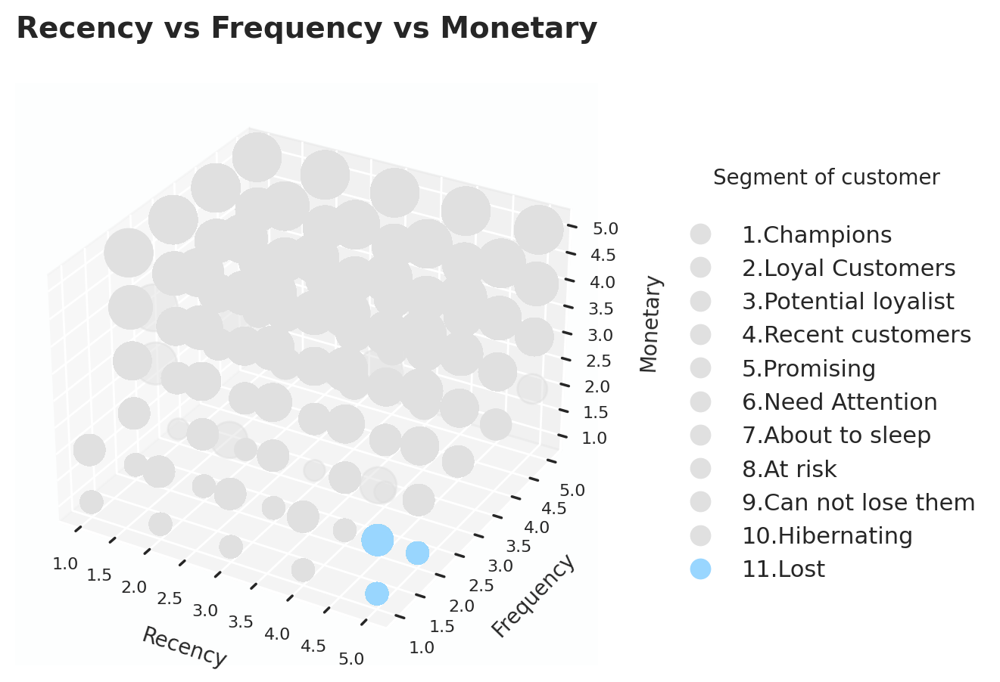

In [112]:
# Consider ONLY Gr. 11

recency = pd.to_numeric(result['rank_R'])
frequency = pd.to_numeric(result['rank_F'])
monetary = pd.to_numeric(result['rank_M'])
segment = result['Group Segment']

# Sort the segment descriptions
segment_sorted = segment.unique()
segment_sorted.sort()

# Create a 3D plot
fig = plt.figure(figsize=(10,5),dpi=200)
ax = fig.add_subplot(111, projection='3d')
ax.set_facecolor('#FDFEFE')

# Define bubble sizes (adjust the scaling factor as needed)
bubble_sizes = monetary * 100

# Define custom colors for each segment (slightly darker shades)
segment_colors = ['#E0E0E0', '#E0E0E0', '#E0E0E0', '#E0E0E0', '#E0E0E0', '#E0E0E0', '#E0E0E0', '#E0E0E0', '#E0E0E0','#E0E0E0', '#99D6FF']


# Extract numerical prefixes from segment names
segment_prefixes = [re.findall(r'^\d+', seg)[0] if re.match(r'^\d+', seg) else '' for seg in segment_sorted]
sorted_indices = sorted(range(len(segment_prefixes)), key=lambda x: int(segment_prefixes[x]) if segment_prefixes[x].isdigit() else float('inf'))

# Sort the segment descriptions based on the numerical prefixes
segment_sorted = [segment_sorted[i] for i in sorted_indices]

# Iterate over segments and plot each segment separately
for i, seg in enumerate(segment_sorted):
    seg_recency = recency[segment == seg]
    seg_frequency = frequency[segment == seg]
    seg_monetary = monetary[segment == seg]
    seg_bubble_sizes = bubble_sizes[segment == seg]
    seg_color = segment_colors[i % len(segment_colors)]

    # Plot Recency vs Frequency vs Monetary as a bubble plot
    ax.scatter(seg_recency, seg_frequency, seg_monetary,
               c=seg_color, s=seg_bubble_sizes, alpha=0.5, label=seg)

# Customizing the plot
ax.set_xlabel('Recency', fontsize=10)
ax.set_ylabel('Frequency', fontsize=10)
ax.set_zlabel('Monetary', fontsize=10)

ax.tick_params(axis='x', which='major', labelsize=8,pad=2)
ax.tick_params(axis='y', which='major', labelsize=8,pad=2)
ax.tick_params(axis='z', which='major', labelsize=8,pad=2)

# Add legend on the right-hand side
legend_elements = [plt.Line2D([0], [0], marker='o', color='w', label=seg, markerfacecolor=color, markersize=10)
                   for seg, color in zip(segment_sorted, segment_colors)]
ax.legend(handles=legend_elements, loc='center left', bbox_to_anchor=(1.1, 0.5), title='Segment of customer\n', title_fontsize=10)

# Set the title with bold font and larger size
ax.set_title('Recency vs Frequency vs Monetary\n', fontweight='bold', fontsize=14)

plt.show()

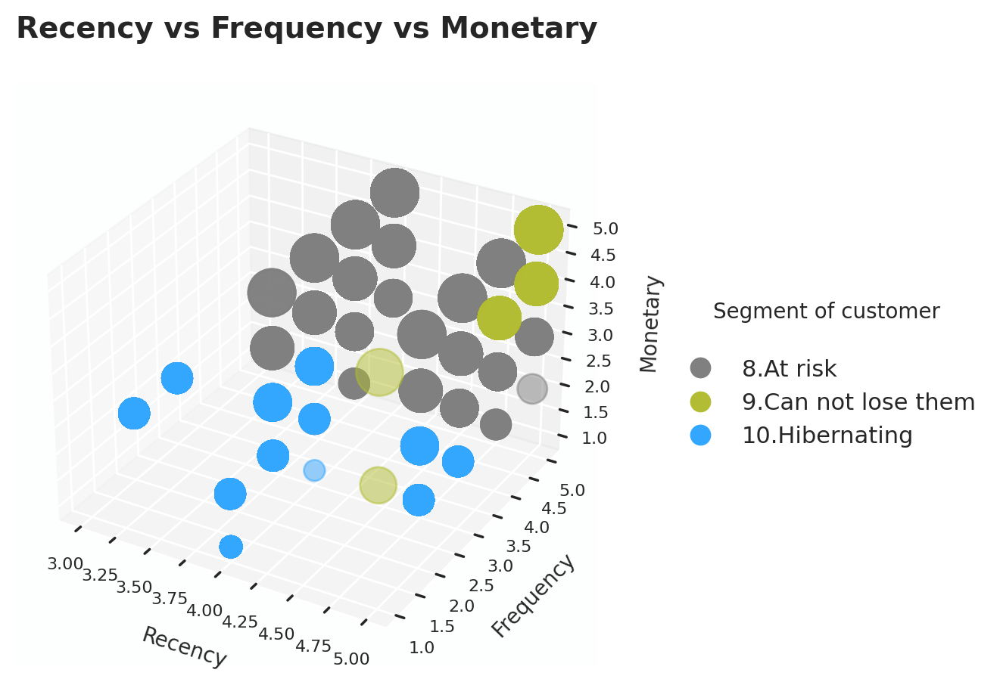

In [113]:
# Consider ONLY Gr. 11

recency = pd.to_numeric(result['rank_R'])
frequency = pd.to_numeric(result['rank_F'])
monetary = pd.to_numeric(result['rank_M'])
segment = result['Group Segment']

# Filter segments
selected_segments = ['8.At risk', '9.Can not lose them', '10.Hibernating']
segment_filtered = segment.isin(selected_segments)

# Sort the segment descriptions based on the numerical prefixes
segment_sorted = segment[segment_filtered].unique()
segment_sorted = sorted(segment_sorted, key=lambda x: int(re.findall(r'^\d+', x)[0]))

# Create a 3D plot
fig = plt.figure(figsize=(10,5),dpi=200)
ax = fig.add_subplot(111, projection='3d')
ax.set_facecolor('#FDFEFE')

# Define bubble sizes (adjust the scaling factor as needed)
bubble_sizes = monetary * 100

# Define custom colors for each segment (slightly darker shades)
segment_colors = ['#808080', '#B2BD33','#33A6FF']


# Extract numerical prefixes from segment names
segment_prefixes = [re.findall(r'^\d+', seg)[0] if re.match(r'^\d+', seg) else '' for seg in segment_sorted]
sorted_indices = sorted(range(len(segment_prefixes)), key=lambda x: int(segment_prefixes[x]) if segment_prefixes[x].isdigit() else float('inf'))

# Sort the segment descriptions based on the numerical prefixes
segment_sorted = [segment_sorted[i] for i in sorted_indices]

# Iterate over segments and plot each segment separately
for i, seg in enumerate(segment_sorted):
    seg_recency = recency[segment == seg]
    seg_frequency = frequency[segment == seg]
    seg_monetary = monetary[segment == seg]
    seg_bubble_sizes = bubble_sizes[segment == seg]
    seg_color = segment_colors[i % len(segment_colors)]

    # Plot Recency vs Frequency vs Monetary as a bubble plot
    ax.scatter(seg_recency, seg_frequency, seg_monetary,
               c=seg_color, s=seg_bubble_sizes, alpha=0.5, label=seg)

# Customizing the plot
ax.set_xlabel('Recency', fontsize=10)
ax.set_ylabel('Frequency', fontsize=10)
ax.set_zlabel('Monetary', fontsize=10)

ax.tick_params(axis='x', which='major', labelsize=8,pad=2)
ax.tick_params(axis='y', which='major', labelsize=8,pad=2)
ax.tick_params(axis='z', which='major', labelsize=8,pad=2)

# Add legend on the right-hand side
legend_elements = [plt.Line2D([0], [0], marker='o', color='w', label=seg, markerfacecolor=color, markersize=10)
                   for seg, color in zip(segment_sorted, segment_colors)]
ax.legend(handles=legend_elements, loc='center left', bbox_to_anchor=(1.1, 0.5), title='Segment of customer\n', title_fontsize=10)

# Set the title with bold font and larger size
ax.set_title('Recency vs Frequency vs Monetary\n', fontweight='bold', fontsize=14)

plt.show()

Text(0, 0.5, 'Total Trans Amt (Million)')

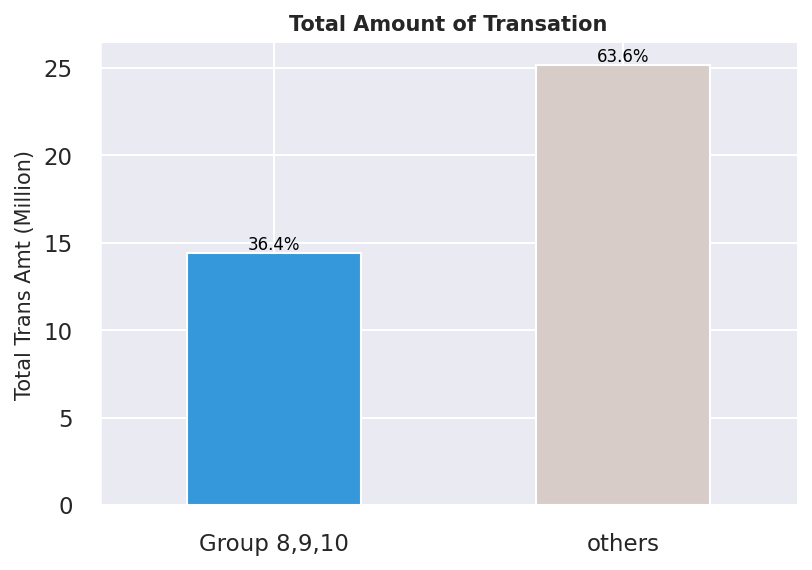

In [116]:
# Calculate the total sum of 'Total_Trans_Amt'
total_sum = filtered_result['Total_Trans_Amt'].sum() / 1e6

colors = ['#3498DB', '#D7CCC8']
fig, ax = plt.subplots(figsize=(6, 4), dpi=150)

bar_plot = (filtered_result.groupby('Group_visualized')['Total_Trans_Amt'].sum() / 1e6).plot(kind='bar', color=colors, ax=ax)
plt.title('Total Amount of Transation', fontweight='bold', fontsize=10)
plt.xlabel('')

bar_plot.set_xticklabels(bar_plot.get_xticklabels(), rotation=0)

# Adding data labels to the bars
for p in ax.patches:
    height = p.get_height()
    percentage = (height / total_sum) * 100
    ax.annotate(f'{percentage:.1f}%', (p.get_x() + p.get_width() / 2, height),
                ha='center', va='bottom', color='black', fontsize=8)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Set the y-axis label to display the scale in millions
ax.set_ylabel('Total Trans Amt (Million)', fontsize=10)


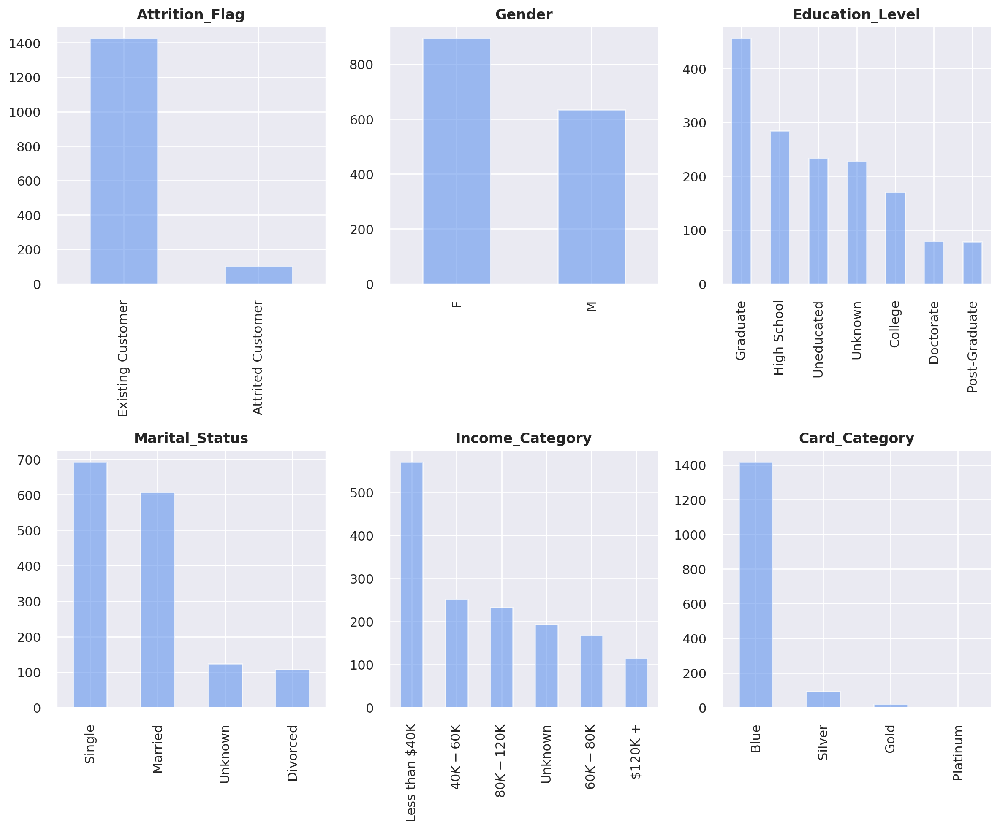

In [117]:
#Focus on Gr.8 : Categorical data

# Select the columns for which you want to plot histograms
columns = ['Attrition_Flag', 'Gender', 'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category']

# Specify the segment you want to filter and plot histograms for
group_segment = '8.At risk'


filtered_df = result[result['Group Segment'] == group_segment]

# Calculate the number of rows and columns for the subplots
num_cols = 3
num_rows = math.ceil(len(columns) / num_cols)

fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(12, 10), dpi=200)
axes = axes.flatten()
hist_color = '#6495ED'

# Iterate over the columns and plot histograms
for i, col in enumerate(columns):
    # Plot histogram for the current column
    filtered_df[col].value_counts().plot(kind='bar', ax=axes[i], color=hist_color , alpha=0.6)

    # Set labels and title for the subplot
    axes[i].set_xlabel(None)
    axes[i].set_ylabel(None)
    axes[i].set_title(col, fontweight='bold')

# Hide any unused subplots
if len(columns) < len(axes):
    for j in range(len(columns), len(axes)):
        axes[j].axis('off')


fig.tight_layout()
plt.show()

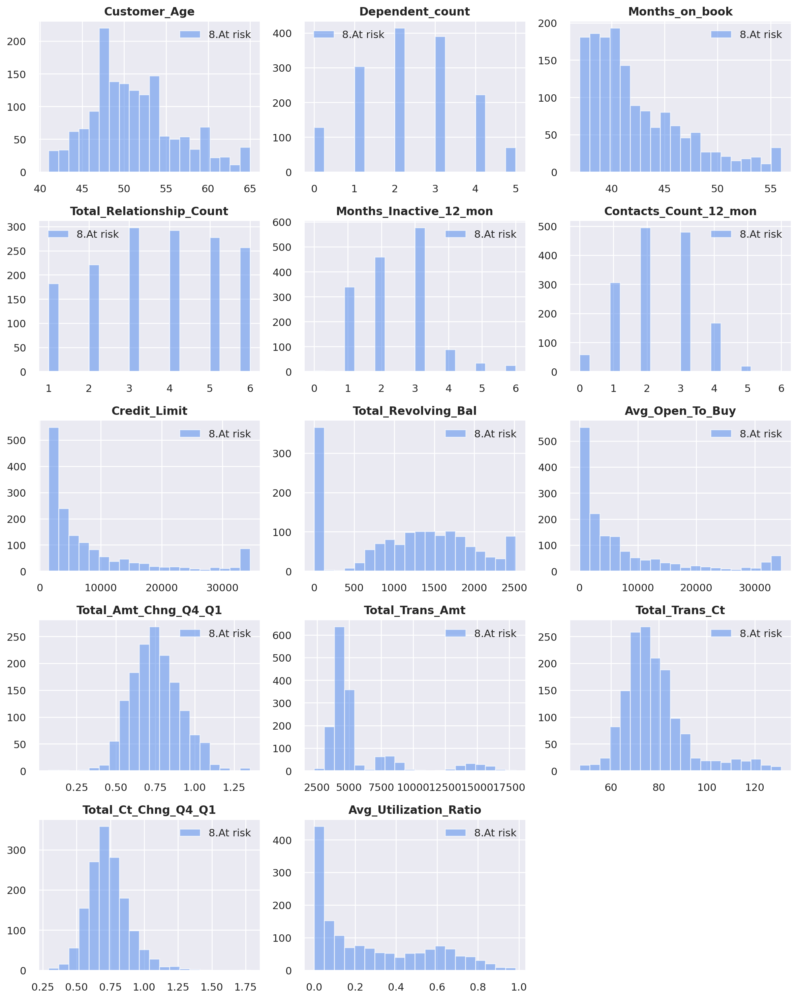

In [119]:
#Focus on Gr.8 : Numrical data

numerical_columns = ['Customer_Age', 'Dependent_count','Months_on_book', 'Total_Relationship_Count',
                     'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
                     'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Trans_Ct',
                     'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']

# Specify the segment you want to filter and plot histograms for
group_segment = '8.At risk'

# Calculate the number of rows and columns for the subplots
num_cols = 3
num_rows = math.ceil(len(numerical_columns) / num_cols)  # Calculate the number of rows based on the number of columns


fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(12,15), dpi=200)
axes = axes.flatten()
hist_color = '#6495ED'

# Iterate over the numerical columns and plot histograms
for i, col in enumerate(numerical_columns):
    # Check if there are any remaining unused subplots
    if i >= len(axes):
        break

    # Iterate over the group segments and plot histograms for each segment
    for segment in group_segments:
        # Filter the data for the current group segment
        segment_data = result[result['Group Segment'] == segment]
        segment_data[col].plot.hist(ax=axes[i], bins=20, color=hist_color, alpha=0.6, label=segment)

    axes[i].set_xlabel(None)
    axes[i].set_ylabel(None)
    axes[i].set_title(col, fontweight='bold',fontsize=12)
    axes[i].legend()

# Hide any unused subplots
if len(numerical_columns) < len(axes):
    for j in range(len(numerical_columns), len(axes)):
        axes[j].axis('off')

fig.tight_layout()
plt.show()


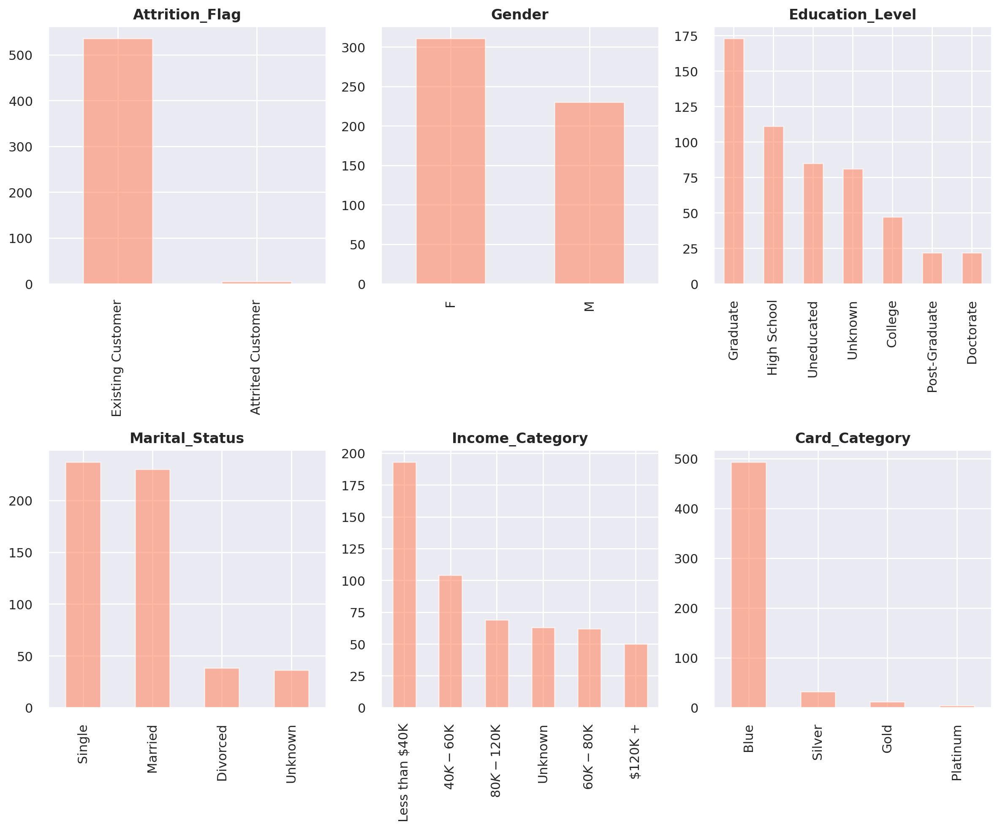

In [123]:
#Focus on Gr.9 : Categorical data

# Select the columns for which you want to plot histograms
columns = ['Attrition_Flag', 'Gender', 'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category']

# Specify the segment you want to filter and plot histograms for
group_segment = '9.Can not lose them'

filtered_df = result[result['Group Segment'] == group_segment]

# Calculate the number of rows and columns for the subplots
num_cols = 3
num_rows = math.ceil(len(columns) / num_cols)

fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(12, 10), dpi=200)
axes = axes.flatten()
hist_color = '#FF8A65'

# Iterate over the columns and plot histograms
for i, col in enumerate(columns):
    # Plot histogram for the current column
    filtered_df[col].value_counts().plot(kind='bar', ax=axes[i], color=hist_color , alpha=0.6)

    # Set labels and title for the subplot
    axes[i].set_xlabel(None)
    axes[i].set_ylabel(None)
    axes[i].set_title(col, fontweight='bold')

# Hide any unused subplots
if len(columns) < len(axes):
    for j in range(len(columns), len(axes)):
        axes[j].axis('off')


fig.tight_layout()
plt.show()

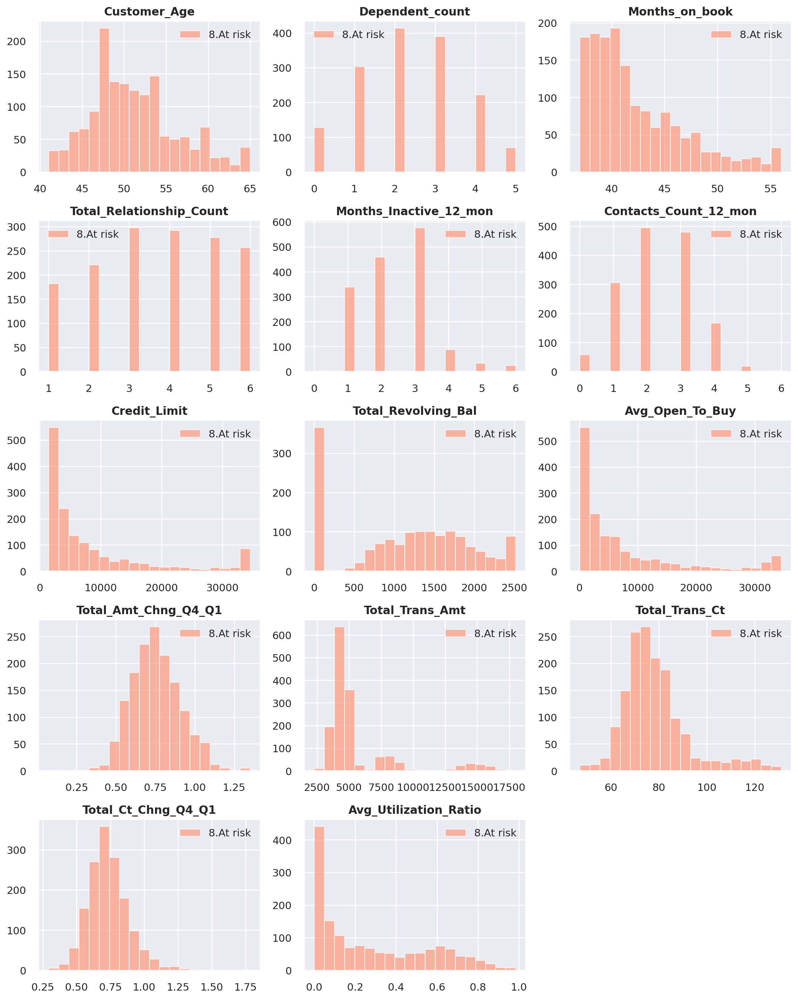

In [77]:
#Focus on Gr.9 : Numrical data

numerical_columns = ['Customer_Age', 'Dependent_count','Months_on_book', 'Total_Relationship_Count',
                     'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
                     'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Trans_Ct',
                     'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']

# Specify the segment you want to filter and plot histograms for
group_segment =  '9.Can not lose them'

# Calculate the number of rows and columns for the subplots
num_cols = 3
num_rows = math.ceil(len(numerical_columns) / num_cols)  # Calculate the number of rows based on the number of columns


fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(12,15), dpi=200)
axes = axes.flatten()
hist_color = '#FF8A65'

# Iterate over the numerical columns and plot histograms
for i, col in enumerate(numerical_columns):
    # Check if there are any remaining unused subplots
    if i >= len(axes):
        break

    # Iterate over the group segments and plot histograms for each segment
    for segment in group_segments:
        # Filter the data for the current group segment
        segment_data = result[result['Group Segment'] == segment]
        segment_data[col].plot.hist(ax=axes[i], bins=20, color=hist_color, alpha=0.6, label=segment)

    axes[i].set_xlabel(None)
    axes[i].set_ylabel(None)
    axes[i].set_title(col, fontweight='bold',fontsize=12)
    axes[i].legend()

# Hide any unused subplots
if len(numerical_columns) < len(axes):
    for j in range(len(numerical_columns), len(axes)):
        axes[j].axis('off')

fig.tight_layout()
plt.show()


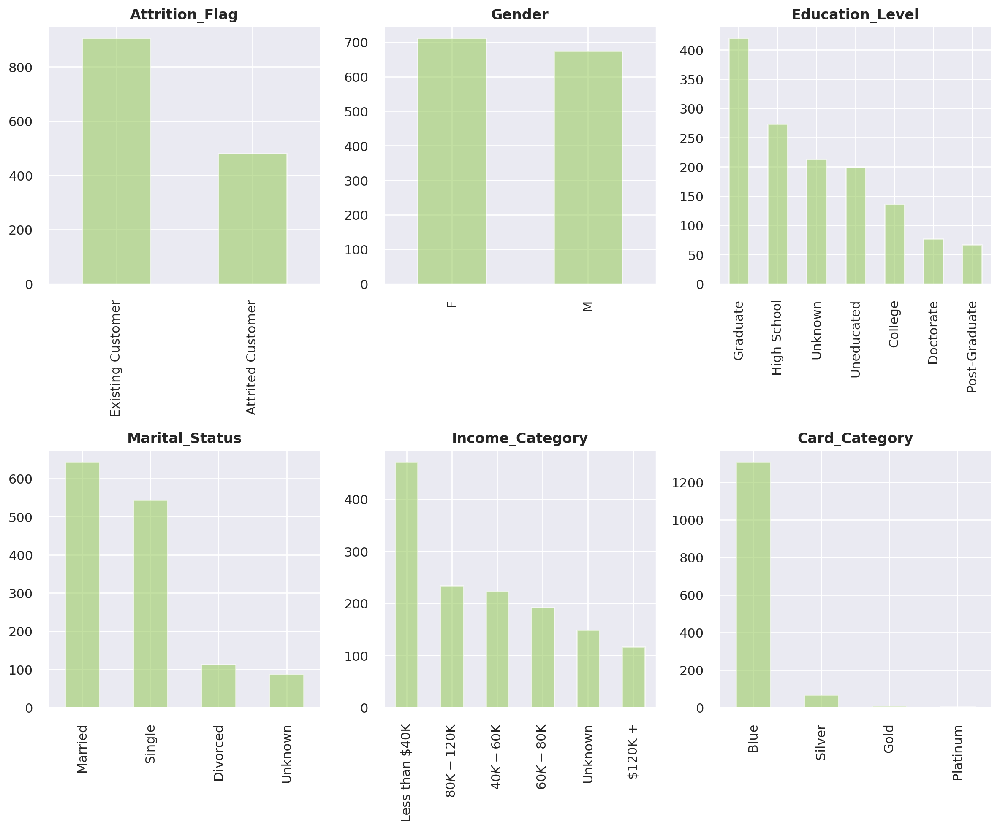

In [73]:
#Focus on Gr.10 : Categorical data

# Select the columns for which you want to plot histograms
columns = ['Attrition_Flag', 'Gender', 'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category']

# Specify the segment you want to filter and plot histograms for
group_segment = '10.Hibernating'

filtered_df = result[result['Group Segment'] == group_segment]

# Calculate the number of rows and columns for the subplots
num_cols = 3
num_rows = math.ceil(len(columns) / num_cols)

fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(12, 10), dpi=200)
axes = axes.flatten()
hist_color = '#9CCC65'

# Iterate over the columns and plot histograms
for i, col in enumerate(columns):
    # Plot histogram for the current column
    filtered_df[col].value_counts().plot(kind='bar', ax=axes[i], color=hist_color , alpha=0.6)

    # Set labels and title for the subplot
    axes[i].set_xlabel(None)
    axes[i].set_ylabel(None)
    axes[i].set_title(col, fontweight='bold')

# Hide any unused subplots
if len(columns) < len(axes):
    for j in range(len(columns), len(axes)):
        axes[j].axis('off')


fig.tight_layout()
plt.show()

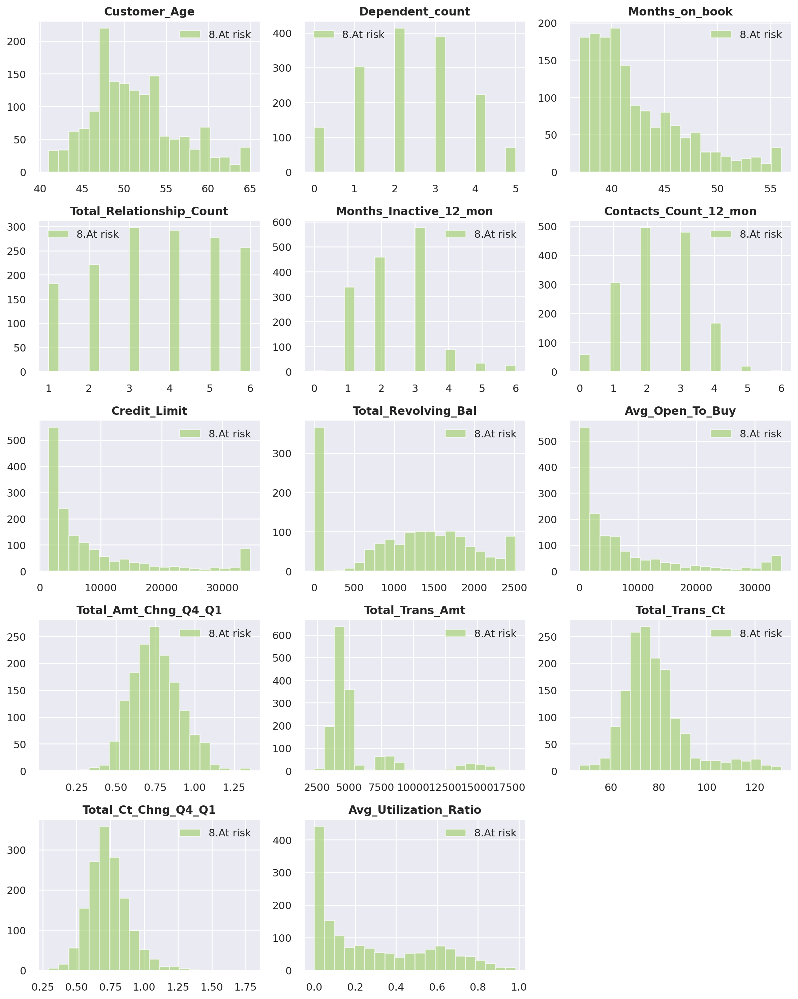

In [80]:
#Focus on Gr.10 : Numrical data

numerical_columns = ['Customer_Age', 'Dependent_count','Months_on_book', 'Total_Relationship_Count',
                     'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
                     'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Trans_Ct',
                     'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']

# Specify the segment you want to filter and plot histograms for
group_segment =  '#9CCC65'

# Calculate the number of rows and columns for the subplots
num_cols = 3
num_rows = math.ceil(len(numerical_columns) / num_cols)  # Calculate the number of rows based on the number of columns


fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(12,15), dpi=200)
axes = axes.flatten()
hist_color = '#9CCC65'

# Iterate over the numerical columns and plot histograms
for i, col in enumerate(numerical_columns):
    # Check if there are any remaining unused subplots
    if i >= len(axes):
        break

    # Iterate over the group segments and plot histograms for each segment
    for segment in group_segments:
        # Filter the data for the current group segment
        segment_data = result[result['Group Segment'] == segment]
        segment_data[col].plot.hist(ax=axes[i], bins=20, color=hist_color, alpha=0.6, label=segment)

    axes[i].set_xlabel(None)
    axes[i].set_ylabel(None)
    axes[i].set_title(col, fontweight='bold',fontsize=12)
    axes[i].legend()

# Hide any unused subplots
if len(numerical_columns) < len(axes):
    for j in range(len(numerical_columns), len(axes)):
        axes[j].axis('off')

fig.tight_layout()
plt.show()


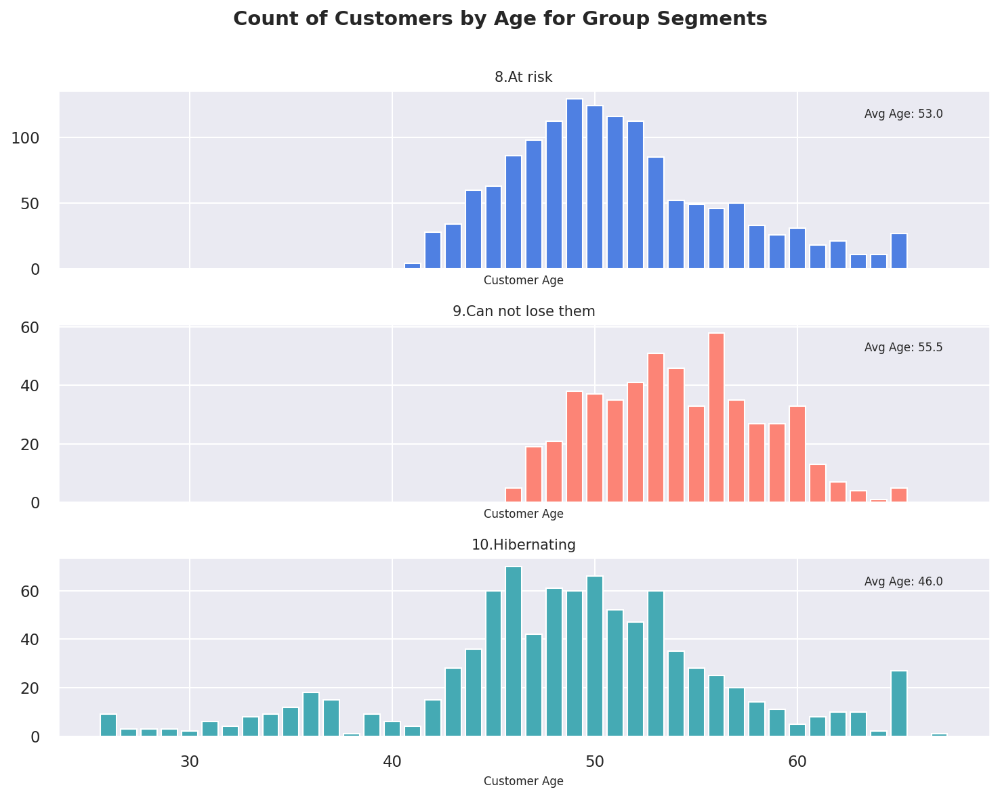

In [131]:
#Consider Customer's Age for Gr.8,9,10

group_segments = ['8.At risk', '9.Can not lose them', '10.Hibernating']
colors = ['#4F80E2', '#FC8476', '#45AAB4']

# Set up the subplots
fig, axes = plt.subplots(nrows=len(group_segments), ncols=1, figsize=(10,8), dpi=150, sharex=True)

# Iterate over each group segment and create separate bar plots
for i, segment in enumerate(group_segments):
    segment_data = filtered_result[filtered_result['Group Segment'] == segment]
    segment_data = segment_data.groupby('Customer_Age').size().reset_index(name='Count')  # Group and count by 'Customer_Age'
    segment_data = segment_data.sort_values('Customer_Age')  # Sort by 'Customer_Age'
    axes[i].bar(segment_data['Customer_Age'], segment_data['Count'], color=colors[i])
    axes[i].set_xlabel('Customer Age',fontsize = 8)
    axes[i].set_ylabel('')
    axes[i].set_title(segment ,fontsize = 10)

    # Calculate the average age for the group segment
    average_age = segment_data['Customer_Age'].mean()

    # Add text annotation for the average age
    axes[i].text(0.95, 0.9, f'Avg Age: {average_age:.1f}', transform=axes[i].transAxes, ha='right', va='top', fontsize=8)

fig.suptitle('Count of Customers by Age for Group Segments\n', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.show()

<ipython-input-128-675f4288095e>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_result['Generation'] = pd.cut(filtered_result['Customer_Age'], bins=[0] + [r[1] for r in generation_ranges.values()], labels=list(generation_ranges.keys()))


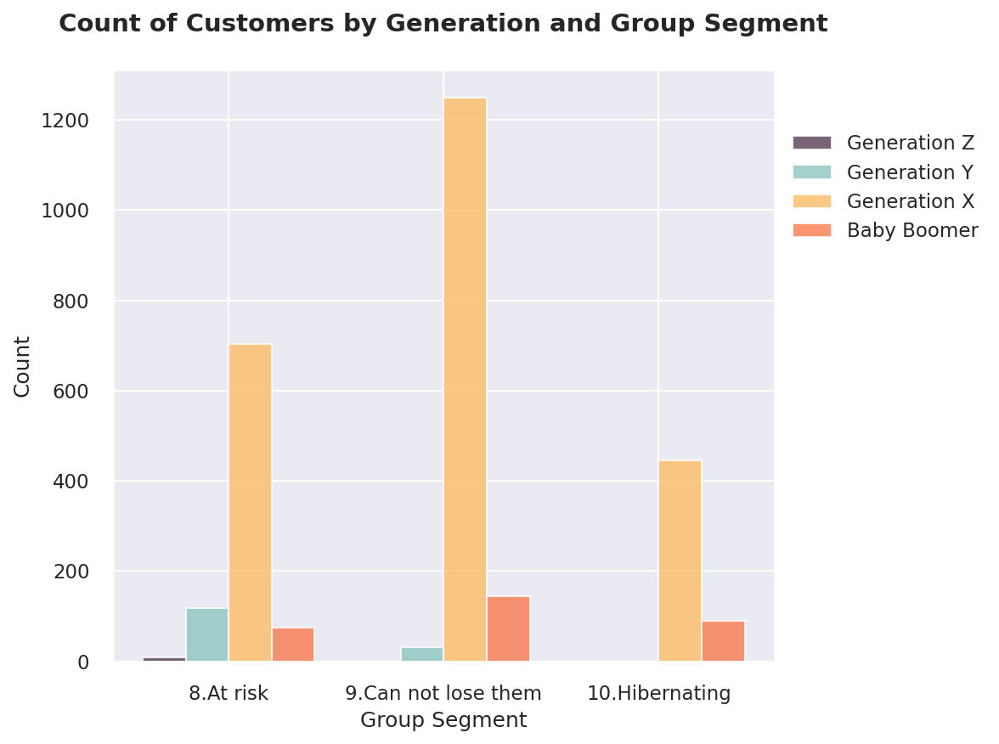

In [128]:
#Consider Customer's Genetatiom for Gr.8,9,10

# Define the age ranges for each generation
generation_ranges = {
    'Generation Z': (11, 26),
    'Generation Y': (27, 42),
    'Generation X': (43, 58),
    'Baby Boomer': (59, 120)
}

# Create a new column 'Generation' based on the age ranges
filtered_result['Generation'] = pd.cut(filtered_result['Customer_Age'], bins=[0] + [r[1] for r in generation_ranges.values()], labels=list(generation_ranges.keys()))

# Filter the data for the selected group segments
filtered_data = filtered_result[filtered_result['Group Segment'].isin(group_segments)]


segment_counts = filtered_data.groupby(['Group Segment', 'Generation']).size().unstack()

# Create a figure with a single subplot
fig, ax = plt.subplots(figsize=(8, 6), dpi=150)

x = np.arange(len(group_segments))

# Set the width of each bar
bar_width = 0.2
generation_colors = {
    'Generation Z': '#584053',
    'Generation Y': '#8DC6BF',
    'Generation X': '#FCBC66',
    'Baby Boomer': '#F97B4F'
}

# Create the bar chart for each generation
for i, generation in enumerate(segment_counts.columns):
    offset = (i - 1.5) * bar_width
    counts = segment_counts[generation]
    ax.bar(x + offset, counts, width=bar_width, label=generation, color=generation_colors[generation], alpha=0.8)

# Set the x-axis labels and title
ax.set_xlabel('Group Segment')
ax.set_ylabel('Count')
ax.set_title('Count of Customers by Generation and Group Segment\n', fontsize=14, fontweight='bold')

# Set the x-axis tick positions and labels
ax.set_xticks(x)
ax.set_xticklabels(group_segments)

# Moving the legend outside of the graph
plt.legend(loc='center left', bbox_to_anchor=(1, 0.8))

# Adjust spacing
plt.tight_layout()

# Display the plot
plt.show()

# print(segment_counts)


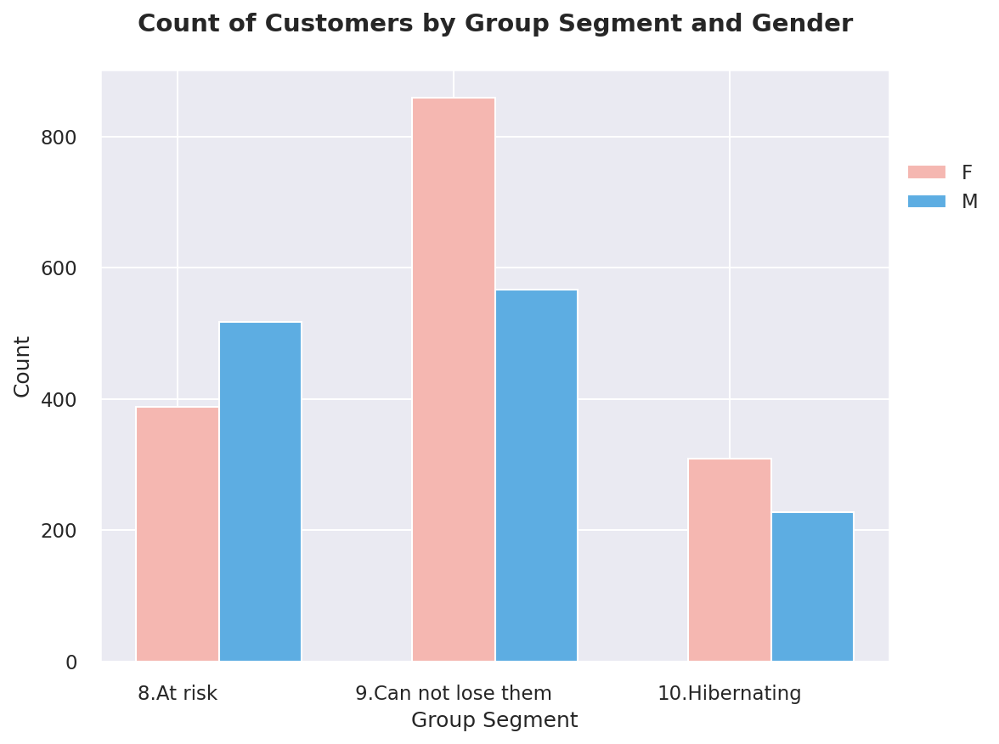

In [129]:
#Consider Customer's Gender for Gr.8,9,10

# Define the group segments
group_segments = ['8.At risk', '9.Can not lose them', '10.Hibernating']

# Define colors for each segment
colors = ['#4F80E2', '#FC8476', '#45AAB4']

# Set up the subplots
fig, ax = plt.subplots(figsize=(8, 6), dpi=150)

# Group and count the data by 'Gender' for each group segment
group_data = filtered_result[filtered_result['Group Segment'].isin(group_segments)]
group_data = group_data.groupby(['Group Segment', 'Gender']).size().unstack()

# Get the unique gender values
genders = group_data.columns

# Calculate the width of each bar
bar_width = 0.3

# Set the x positions for the bars
x = range(len(group_segments))

# Create grouped bar chart
colors_ =['#F5B7B1','#5DADE2']
for i, gender in enumerate(genders):
    ax.bar([val + i * bar_width for val in x], group_data[gender], width=bar_width, color=colors_[i],label=gender)

# Set x-axis tick labels
ax.set_xticks(x)
ax.set_xticklabels(group_segments)

# Set labels and title
ax.set_xlabel('Group Segment')
ax.set_ylabel('Count')
ax.set_title('Count of Customers by Group Segment and Gender\n', fontsize=14, fontweight='bold')

# Moving the legend outside of the graph
plt.legend(loc='center left', bbox_to_anchor=(1, 0.8))

# Adjust spacing between subplots
plt.tight_layout()

# Display the plot
plt.show()


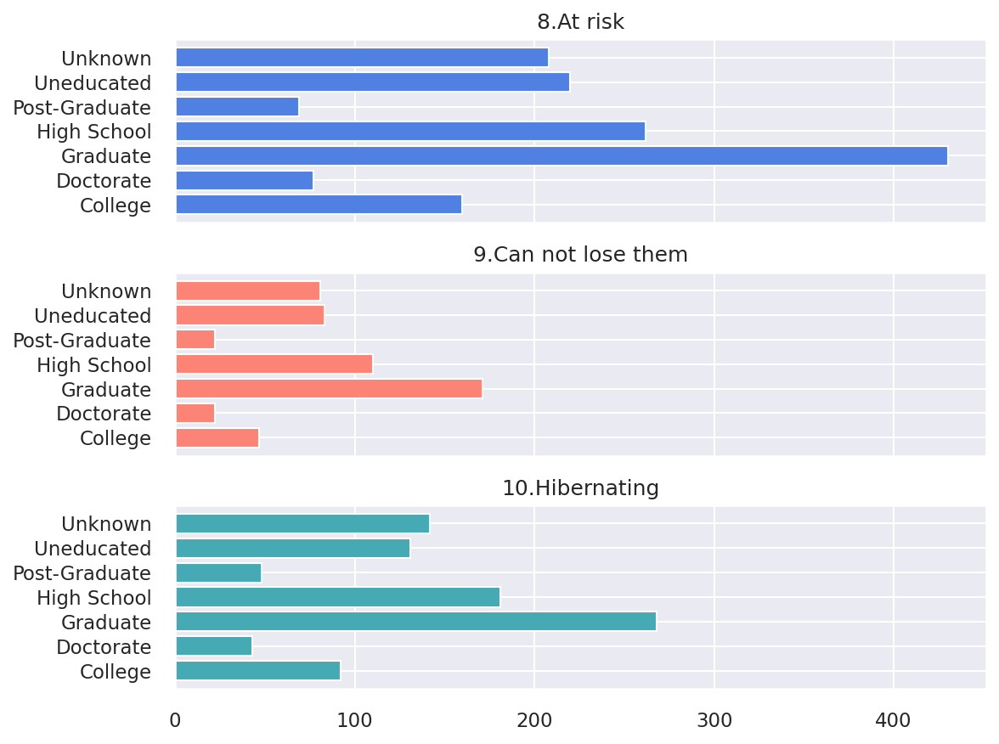

In [132]:
#Consider Customer's Education Level for Gr. 8, 9, 10

# Define the group segments
group_segments = ['8.At risk', '9.Can not lose them', '10.Hibernating']
colors = ['#4F80E2', '#FC8476', '#45AAB4']

fig, axes = plt.subplots(nrows=len(group_segments), ncols=1, figsize=(8, 6), dpi=150, sharex=True)

# Iterate over each group segment and create separate horizontal bar plots
for i, segment in enumerate(group_segments):
    ax = axes[i]
    segment_data = filtered_result[filtered_result['Group Segment'] == segment]
    segment_data = segment_data.groupby('Education_Level').size().reset_index(name='Count')  # Group and count by 'Education_Level'
    segment_data = segment_data.sort_values('Education_Level')  # Sort by 'Education_Level'
    ax.barh(segment_data['Education_Level'], segment_data['Count'], color=colors[i])  # Use barh for horizontal bar plot
    ax.set_title(segment)


plt.tight_layout()
plt.show()


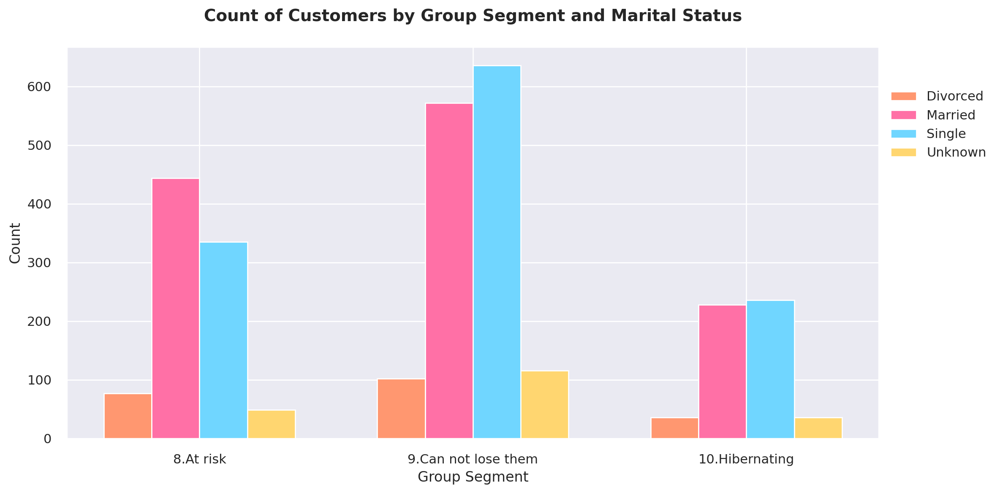

In [139]:
#Consider Customer's Marital_Status for 8, 9, 10

group_segments = ['8.At risk', '9.Can not lose them', '10.Hibernating']

# Set up the subplots
fig, ax = plt.subplots(figsize=(12, 6), dpi=200)

group_data = filtered_result[filtered_result['Group Segment'].isin(group_segments)]
group_data = group_data.groupby(['Group Segment', 'Marital_Status']).size().unstack()

marital_statuses = group_data.columns

# Calculate the width of each bar
total_bars = len(group_segments)
total_groups = len(marital_statuses)
bar_width = 0.7 / total_groups

# Set the x positions for the bars
x = np.arange(total_bars)

# Define the colors for each group
colors = [ '#ff9770','#ff70a6','#70d6ff', '#ffd670']

# Check if the number of colors matches the number of groups
if len(colors) != total_groups:
    raise ValueError("The number of colors should match the number of groups.")

# Create grouped bar chart
for i, marital_status in enumerate(marital_statuses):
    offset = (i - (total_groups - 1) / 2) * bar_width
    ax.bar(x + offset, group_data[marital_status], width=bar_width, color=colors[i], label=marital_status)

# Set x-axis tick labels
ax.set_xticks(x)
ax.set_xticklabels(group_segments)

# Set labels and title
ax.set_xlabel('Group Segment')
ax.set_ylabel('Count')
ax.set_title('Count of Customers by Group Segment and Marital Status\n', fontsize=14, fontweight='bold')

plt.legend(loc='center left', bbox_to_anchor=(1, 0.8))
plt.tight_layout()
plt.show()


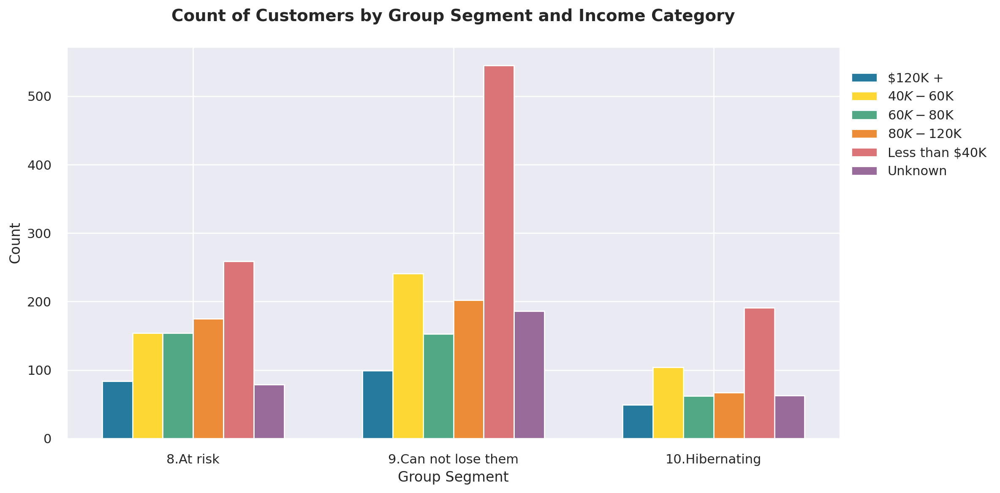

In [144]:
#Consider Customer's Income for 8, 9, 10

group_segments = ['8.At risk', '9.Can not lose them', '10.Hibernating']

# Set up the subplots
fig, ax = plt.subplots(figsize=(12, 6), dpi=200)

# Group and count the data by 'Income_Category'
group_data = filtered_result[filtered_result['Group Segment'].isin(group_segments)]
group_data = group_data.groupby(['Group Segment', 'Income_Category']).size().unstack()

income_categories = group_data.columns

# Calculate the width of each bar
total_bars = len(group_segments)
total_groups = len(income_categories)
bar_width = 0.7 / total_groups

# Set the x positions for the bars
x = np.arange(total_bars)

colors = ['#267A9E', '#FDD835', '#51A885', '#ED8C37', '#DB7476', '#986b9b']

# Create grouped bar chart
for i, income_category in enumerate(income_categories):
    offset = (i - (total_groups - 1) / 2) * bar_width
    ax.bar(x + offset, group_data[income_category], width=bar_width, color=colors[i], label=income_category)

# Set x-axis tick labels
ax.set_xticks(x)
ax.set_xticklabels(group_segments)

# Set labels and title
ax.set_xlabel('Group Segment')
ax.set_ylabel('Count')
ax.set_title('Count of Customers by Group Segment and Income Category\n', fontsize=14, fontweight='bold')

plt.legend(loc='center left', bbox_to_anchor=(1, 0.8))
plt.tight_layout()
plt.show()


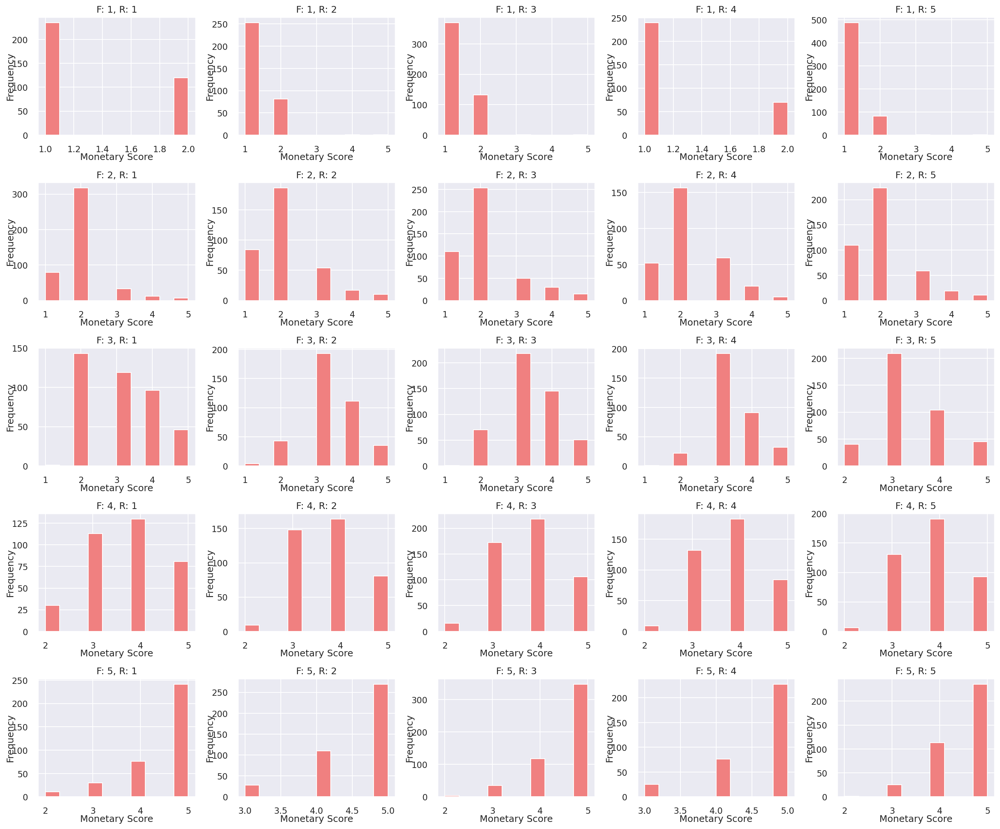

In [153]:
#Consider all possible combinations of frequency and recency scores

# Assuming you have three lists of ranks: rank_R, rank_F, rank_M
rank_R = result['rank_R']
rank_F = result['rank_F']
rank_M = result['rank_M']

# Creating a 5x5 grid of subplots (25 plots in total)
fig, axs = plt.subplots(5, 5, figsize=(18, 15), dpi=150)

# Iterating over all possible combinations of frequency and recency scores
for i, freq_score in enumerate(np.unique(rank_F)):
    for j, re_score in enumerate(np.unique(rank_R)):
        # Filtering the data for the current combination of scores
        filtered_data = rank_M[(rank_F == freq_score) & (rank_R == re_score)]

        # Plotting the histogram on the corresponding subplot with a custom color
        axs[i, j].hist(filtered_data, bins=10, color='#F08080')

        # Setting the title for the subplot
        axs[i, j].set_title(f'F: {freq_score}, R: {re_score}')

        # Setting labels for x and y axes
        axs[i, j].set_xlabel('Monetary Score')
        axs[i, j].set_ylabel('Frequency')

        # Adjusting the spacing between subplots
        axs[i, j].xaxis.set_label_coords(0.5, -0.15)
        axs[i, j].yaxis.set_label_coords(-0.15, 0.5)

plt.tight_layout()
plt.show()


# Additional:


---


Attrited Customer Information

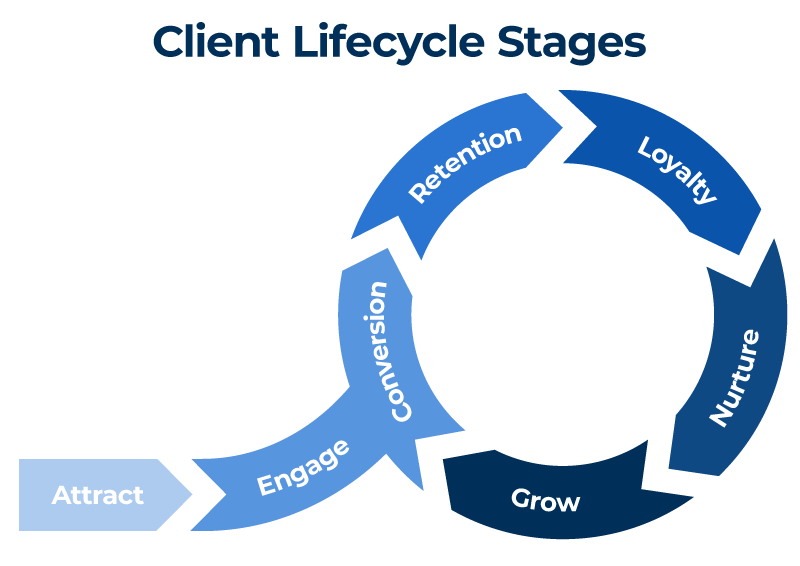

In [158]:
df_attrited = result[(result['Attrition_Flag'] == 'Attrited Customer')]
df_attrited.head(5)

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,percentile_F,rank_F,percentile_M,rank_M,type,RFM,Segment,No,Group Segment,Group_visualized
39,738627708,Attrited Customer,49,F,2,Unknown,Single,Unknown,Blue,41,...,0.211563,2,0.181396,1,421,421,About to sleep,7,7.About to sleep,others
40,715371108,Attrited Customer,45,M,3,Graduate,Married,$80K - $120K,Blue,40,...,0.211563,2,0.133307,1,421,421,About to sleep,7,7.About to sleep,others
41,710333883,Attrited Customer,48,M,3,Graduate,Married,$60K - $80K,Blue,37,...,0.211563,2,0.197739,1,421,421,About to sleep,7,7.About to sleep,others
42,709435533,Attrited Customer,53,F,1,Unknown,Single,Less than $40K,Blue,41,...,0.238866,2,0.076281,1,421,421,About to sleep,7,7.About to sleep,others
43,716271183,Attrited Customer,45,F,2,Uneducated,Single,Less than $40K,Blue,37,...,0.211563,2,0.152167,1,421,421,About to sleep,7,7.About to sleep,others


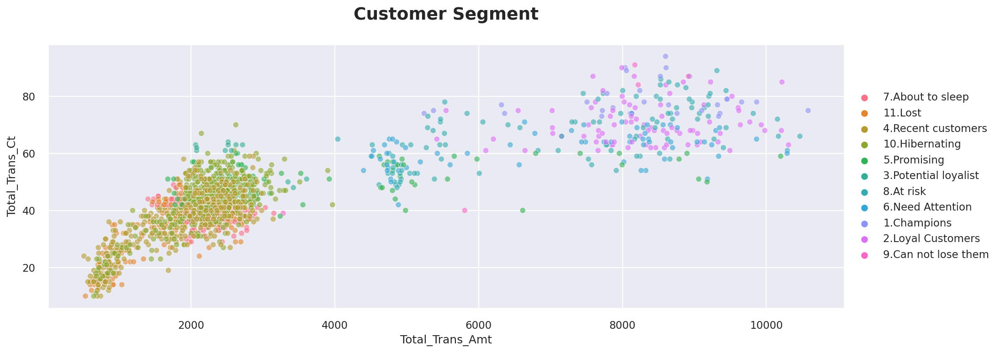

In [159]:
#Attrited Customer -- Customer Segment : Frequency Vs Monetry

sns.set(rc={'figure.dpi': 150})
plt.figure(figsize=(15, 5), dpi=150)
ax = plt.gca()
sns.scatterplot(data=df_attrited, x="Total_Trans_Amt", y="Total_Trans_Ct", hue='Group Segment', alpha=0.6, ax=ax)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.title("Customer Segment\n", fontsize=18, fontweight='bold')

plt.show()

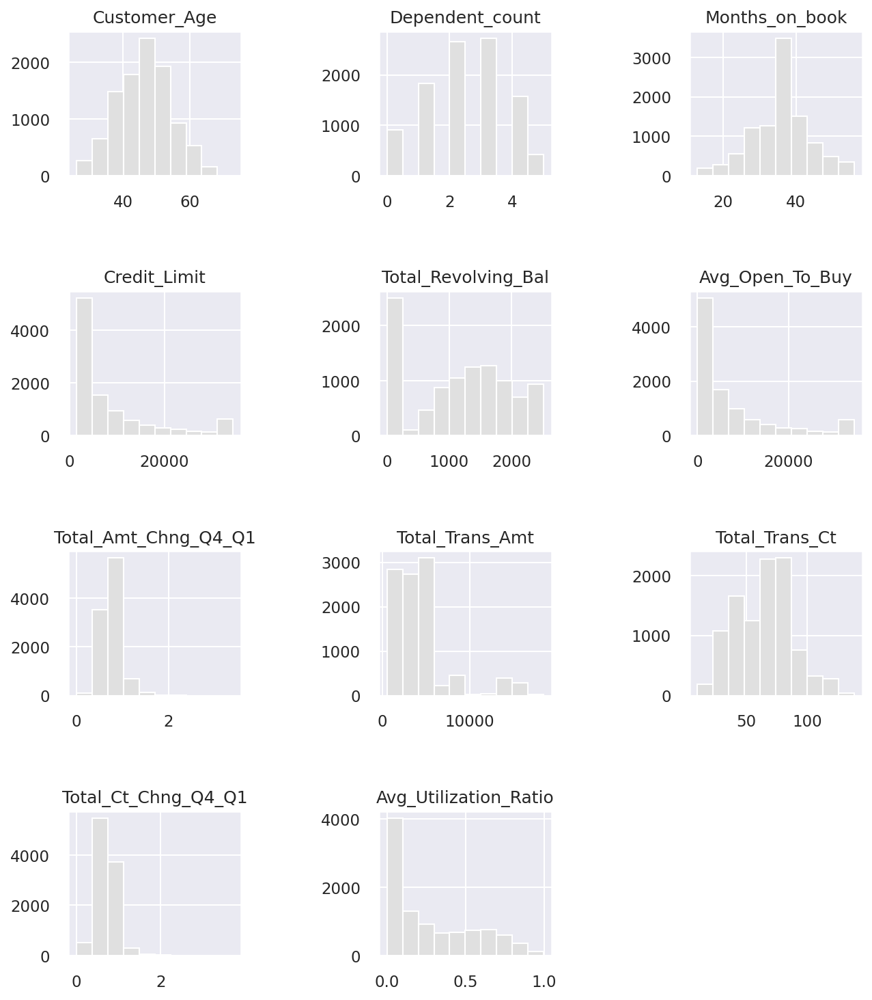

In [164]:
#Attrited Customer: Categorical data

fig = plt.figure(figsize=(10, 15))
fig.subplots_adjust(hspace=0.8, wspace=0.8)

num_col = ['Customer_Age', 'Dependent_count', 'Months_on_book', 'Credit_Limit', 'Total_Revolving_Bal',
           'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Trans_Ct',
           'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']

for i, var in enumerate(num_col):
    ax = fig.add_subplot(5, 3, i+1)
    ax.hist(df_bank[var], color='#E0E0E0')
    ax.set_title(var)

plt.show()

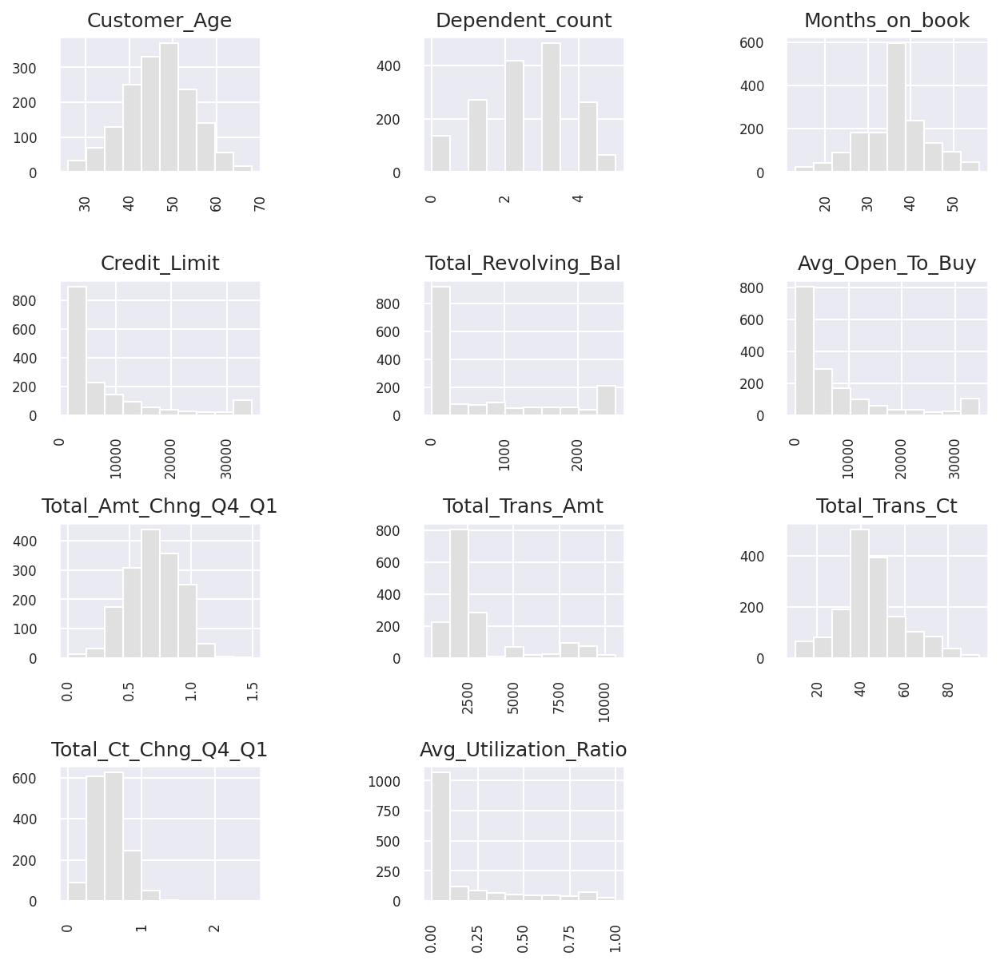

In [161]:
#Attrited Customer: Numerical data

fig = plt.figure(figsize=(10, 12))
fig.subplots_adjust(hspace=0.8, wspace=0.8)

num_col = ['Customer_Age', 'Dependent_count', 'Months_on_book', 'Credit_Limit', 'Total_Revolving_Bal',
           'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Trans_Ct',
           'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']

for i, col in enumerate(num_col):
    ax = fig.add_subplot(5, 3, i+1)
    ax.hist(df_attrited[col], color='#E0E0E0')
    ax.set_title(col)
    ax.set_xlabel(None)
    ax.set_ylabel(None)
    ax.tick_params(axis='both', labelsize=8)
    ax.xaxis.set_tick_params(rotation=90)

plt.show()
